# Advanced Machine Learning and Causal Analysis on Agricultural Yield Data: A Comprehensive Approach

**Author: Variyas Nitin Singlaa (A1872896)**


## Introduction

This notebook presents a comprehensive analysis of a large dataset using various machine learning and causal inference techniques. The primary goal of this project is to understand the factors influencing crop yield and to accurately predict yield based on available features.

### Objectives

1. **Data Preprocessing:** Handle missing values, standardize features, and prepare the data for modeling.
2. **Exploratory Data Analysis (EDA):** Perform visual and statistical analyses to uncover patterns and relationships in the data.
3. **Feature Selection:** Identify the most relevant features for predictive modeling using techniques like Stepwise Forward Selection and Backward Elimination.
4. **Modeling:** Apply multiple regression models, including Linear Regression, Lasso Regression, Ridge Regression, and Random Forest, to predict crop yield.
5. **Model Evaluation:** Evaluate model performance using metrics such as Mean Squared Error (MSE) and R-squared (R²).
6. **Causal Inference:** Utilize methods like DoWhy and Causal Forests to estimate the causal effect of selected features on crop yield.
7. **Comparison of Models:** Compare the performance of different models and methods to identify the most effective approach for predicting crop yield.

### Data Description

The dataset contains various features that potentially impact crop yield, including weather conditions, soil properties, and agricultural practices. Key features include:
- `soilCapacity`: Soil water holding capacity
- `yield`: Crop yield
- `EpSum`, `EpAfterFlowering`, `CGRAroundFlowering`, `EpSum_1`: Weather and growth-related metrics

### APSIM Output Variables

**Periodicity of Output:**

APSIM's text, space-separated output files can be flexibly configured. The time dimension is represented by rows, and the state dimension is represented by columns. Multiple independent output components can be configured in a simulation.

- **Rows (Temporal):** Common periods include daily, weekly, harvest, and annual (calendar). Each period is characterized by an event that marks its termination. Depending on this interval, variables may need to be averaged, summed, etc. This can be done with an APSIM module called "Tracker" or in bespoke manager (runtime compiled C#) code.
- **Columns:** APSIM's modules have variables that can be reported. Modules have a concept of "ownership" - the variables that it maintains reflect the domain of that module.

**Table of Useful Variables:**

**Meteorological:**
- `rain` (mm/day)
- `maxt`, `mint` (9 AM min, max temperatures)
- `radn` (Mj/m²) solar radiation

**Soil Related:**
- `dlayer`: Depth of layer i (array of mm)
- `SW`: Instantaneous water content (mm/mm)
- `Air_dry`, `LL15`, `DUL`, `SAT`: Static limits of bucket size (array of mm/mm)
- `XX_dep`: Same as above, but in (array of mm/layer)
- `ESW`: Extractable soil water (mm) - relative to LL15
- `ES`: Soil evaporation (mm/day)
- `EO`: Potential (unlimited) soil evaporation
- `EOS`: Potential (unlimited) soil evaporation limited by cover
- `cover_surface_runoff`: Total cover from crops & residues, adjusted for height (0-1)
- `Runoff`: Water that doesn't infiltrate must run off
- `Drain`: Water content above DUL drains into layers below. The bottom layer drains to...
- `surfaceom_wt`: Surface residue - stubble & harvester remains (kg/ha)
- `NO3`: Nitrogen - key plant nutrient (kg/ha), comes from both fertilizer and residue decomposition (from roots and organic C pools)

**Crop Related (All weights are oven dry):**
- `biomass_wt`: The total instantaneous weight (g/m²)
- `biomass_n`: N content (g/m²)
- `[root, leaf, stem, grain]GreenWt`: Active plant organ weights. Some organs will have significant SenescedWt - e.g., leaves at maturity.
- `XXXGreenN`: N content of organs (g/m²)
- `cover_green`: Green (photosynthetically active) cover (0-1)
- `cover_tot`: Green and senesced cover (0-1)
- `TT`: Instantaneous Thermal Time (°C/day) - development rate.
- `Ep`: Water uptake (mm)
- `Height`: Height of crop (mm) - often simplistic.
- `LAI`: Leaf Area Index - the area available to soak up radiation (m²/m²), will exceed cover (0-1).
- `FiPAR`: Fraction of intercepted photosynthetically active radiation
- `SLAI`: Senesced leaf area index (m²/m²)
- `LL`: (crop specific) lower limit of water extraction (array of mm/mm)
- `nfact_photo`: Instantaneous stress factor in photosynthesis calculation (0-1)
- `root_depth`: Depth that roots extend to (mm)
- `swdef_photo`: Soil water deficit factor in photosynthesis calc (0-1)
- `StageName`: The (instant) phenological stage name.
- `Yield`: Grain yield (kg/ha)

**Useful Summaries:**
- **Crop starting & finishing water content**: Used to calculate gross Water Uptake = start + rain - finishing
- **In-crop water uptake**: A key measure of transpiration, either sum of Ep or from soil water calc above.
- **PAWC**: Plant Available Water [Capacity|Content] (mm). Crop specific, relative to crop LL, includes soil toxicity constraints that aren't in LL15
- **Harvest Index (HI)**: Grain yield / total weight - efficiency measure.
- **Water Use Efficiency (WUE)**: Grain produced / water used (kg/mm) - index of production effectiveness
- **PhotoThermalQuotient (PTQ)**: Mean(radiation / mean temperature) over significant crop phases (e.g., grain filling)
- **NDVI vs. LAI**: LAI is the green component, NDVI is a reflectance. There are approximations that usually ignore yellow grains.

### Methods

1. **Data Preprocessing:** Ensuring the dataset is clean and ready for analysis by handling missing values and scaling features appropriately.
2. **Exploratory Data Analysis (EDA):** Generating visualizations like pair plots, correlation heatmaps, and feature importance plots to understand the relationships between features and crop yield.
3. **Feature Selection:** Using statistical techniques to identify the most important features for predictive modeling.
4. **Model Training and Evaluation:** Applying different machine learning models to the dataset and evaluating their performance using various metrics.
5. **Causal Inference:** Employing causal inference techniques to estimate the causal effects of key features on crop yield.

This notebook aims to provide a thorough analysis, combining traditional machine learning approaches with advanced causal inference methods, to offer insights into the factors affecting crop yield and to develop robust predictive models.

# Import Libraries


In [287]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import SelectFromModel, RFE, RFECV
from sklearn.decomposition import PCA
import geopandas as gpd
from shapely.geometry import Point
from joblib import Parallel, delayed
from pgmpy.estimators import PC, HillClimbSearch, BicScore
import networkx as nx
import shap


# Data Loading

We begin by loading the data from a Feather file, which is efficient for reading/writing and works well with pandas DataFrames. We also perform initial inspections of the data to understand its structure, missing values, and basic statistics.

## Initial Exploration of the Dataset

### First Few Rows of the Dataset

The dataset contains multiple features related to agricultural data. Below are the first few rows of the dataset to give an initial glimpse of its structure:



In [137]:
# Load the data from a Feather file
data_path = "DataFiles/mds_data.feather"
data = pd.read_feather(data_path)

# Function to display dataset information
def display_dataset_info(data):
    # Display the first few rows of the dataset
    print("First few rows of the dataset:")
    display(data.head())

    # Display summary statistics of the dataset
    print("Summary statistics of the dataset:")
    display(data.describe())

    # Display information about datatypes and missing values
    print("Data type information:")
    data_info = data.info()  # This will print info by default
    return data_info

# Execute the function to display data information
display_dataset_info(data)

First few rows of the dataset:


,name,longitude,latitude,simDoc,soilCapacity,initialSW,NFert,sowDate,cultivar,pldensity,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
0,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,94.9,33.7,48.5,12.7,0.912,0.000,25.181,9.978,17.580,155.524
1,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,36.4,21.1,0.0,15.3,1.070,0.000,24.963,6.979,15.971,27.071
2,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,422.7,270.6,152.1,0.0,0.937,90.279,24.904,9.834,17.369,139.898
3,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,243.8,219.8,20.5,3.5,1.001,23.366,23.940,8.495,16.218,163.028
4,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,159.5,39.0,111.8,8.7,0.909,21.629,25.146,9.936,17.541,147.106


Summary statistics of the dataset:


,longitude,latitude,SSC_start,SSC_slowstart,year,yield,pawc,EpSum,EpBeforeFlowering,EpAroundFlowering,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
count,1.894720e+06,1.894720e+06,1.894720e+06,1894720.0,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,...,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06
mean,1.486098e+02,-2.987658e+01,1.250000e+03,0.0,1.964481e+03,1.592946e+03,1.140664e+02,1.050434e+02,5.342006e+01,3.250333e+01,...,1.797116e+02,8.813619e+01,3.363670e+01,5.793874e+01,1.166192e+00,4.329284e+00,2.367786e+01,9.015125e+00,1.634649e+01,1.661323e+02
std,2.219971e+00,3.759662e+00,5.590171e+02,0.0,3.165530e+01,1.069601e+03,6.358252e+01,5.626906e+01,2.842153e+01,2.318844e+01,...,9.409167e+01,5.737474e+01,3.179930e+01,4.772727e+01,1.155795e-01,1.007735e+01,4.138004e+00,3.397722e+00,3.690031e+00,1.342527e+02
min,1.438883e+02,-3.570903e+01,5.000000e+02,0.0,1.910000e+03,5.409000e+01,2.000000e+01,7.415000e+00,4.177000e+00,2.800000e-02,...,7.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,7.130000e-01,0.000000e+00,1.546600e+01,2.934000e+00,1.053300e+01,1.360000e-01
25%,1.481651e+02,-3.221862e+01,8.750000e+02,0.0,1.937000e+03,7.584715e+02,6.000000e+01,6.103300e+01,3.133900e+01,1.463700e+01,...,1.094000e+02,4.590000e+01,9.000000e+00,2.220000e+01,1.090000e+00,0.000000e+00,2.051700e+01,6.289000e+00,1.339500e+01,6.084500e+01
50%,1.489875e+02,-3.031952e+01,1.250000e+03,0.0,1.964000e+03,1.301054e+03,1.026460e+02,9.298800e+01,4.832300e+01,2.810700e+01,...,1.690000e+02,7.820000e+01,2.510000e+01,4.690000e+01,1.171000e+00,2.150000e-01,2.325300e+01,8.079000e+00,1.564400e+01,1.316440e+02
75%,1.497990e+02,-2.718179e+01,1.625000e+03,0.0,1.992000e+03,2.224575e+03,1.450000e+02,1.405840e+02,6.953900e+01,4.531600e+01,...,2.354000e+02,1.196000e+02,4.920000e+01,8.190000e+01,1.248000e+00,3.876000e+00,2.646000e+01,1.124900e+01,1.881500e+01,2.390940e+02
max,1.512573e+02,-2.351129e+01,2.000000e+03,0.0,2.019000e+03,6.848369e+03,2.850000e+02,5.209380e+02,2.487350e+02,1.495520e+02,...,6.436000e+02,5.328000e+02,2.572000e+02,3.809000e+02,1.667000e+00,1.345010e+02,3.498400e+01,2.043200e+01,2.761900e+01,7.059920e+02


Data type information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1894720 entries, 0 to 1894719
Data columns (total 37 columns):
 #   Column               Dtype   
---  ------               -----   
 0   name                 object  
 1   longitude            float64 
 2   latitude             float64 
 3   simDoc               object  
 4   soilCapacity         category
 5   initialSW            category
 6   NFert                category
 7   sowDate              category
 8   cultivar             category
 9   pldensity            category
 10  SSC_start            float64 
 11  SSC_slowstart        float64 
 12  year                 int32   
 13  yield                float64 
 14  pawc                 float64 
 15  EpSum                float64 
 16  EpBeforeFlowering    float64 
 17  EpAroundFlowering    float64 
 18  EpAfterFlowering     float64 
 19  EsSum                float64 
 20  EsBeforeFlowering    float64 
 21  EsAroundFlowering    float64 
 22  EsAfterFlowering   

# Data Preprocessing

Here we handle missing values, data type conversions, and initial feature engineering. This includes converting dates and creating new columns based on existing data, which are critical for later analysis.

In [138]:
# Check for missing values in the dataset
missing_data = data.isnull().sum()
print("Missing values in each column:")
print(missing_data)

# Display data types of the columns
data_types = data.dtypes
print("Data types of each column:")
print(data_types)


Missing values in each column:
name                   0
longitude              0
latitude               0
simDoc                 0
soilCapacity           0
initialSW              0
NFert                  0
sowDate                0
cultivar               0
pldensity              0
SSC_start              0
SSC_slowstart          0
year                   0
yield                  0
pawc                   0
EpSum                  0
EpBeforeFlowering      0
EpAroundFlowering      0
EpAfterFlowering       0
EsSum                  0
EsBeforeFlowering      0
EsAroundFlowering      0
EsAfterFlowering       0
RadnSum                0
RadnBeforeFlowering    0
RadnAroundFlowering    0
RadnAfterFlowering     0
RainSum                0
RainBeforeFlowering    0
RainAroundFlowering    0
RainAfterFlowering     0
PTQSum                 0
RunOffSum              0
MaxTAVG                0
MinTAVG                0
MeanTAVG               0
CGRAroundFlowering     0
dtype: int64
Data types of each column:
name

## Outlier Detection and Management

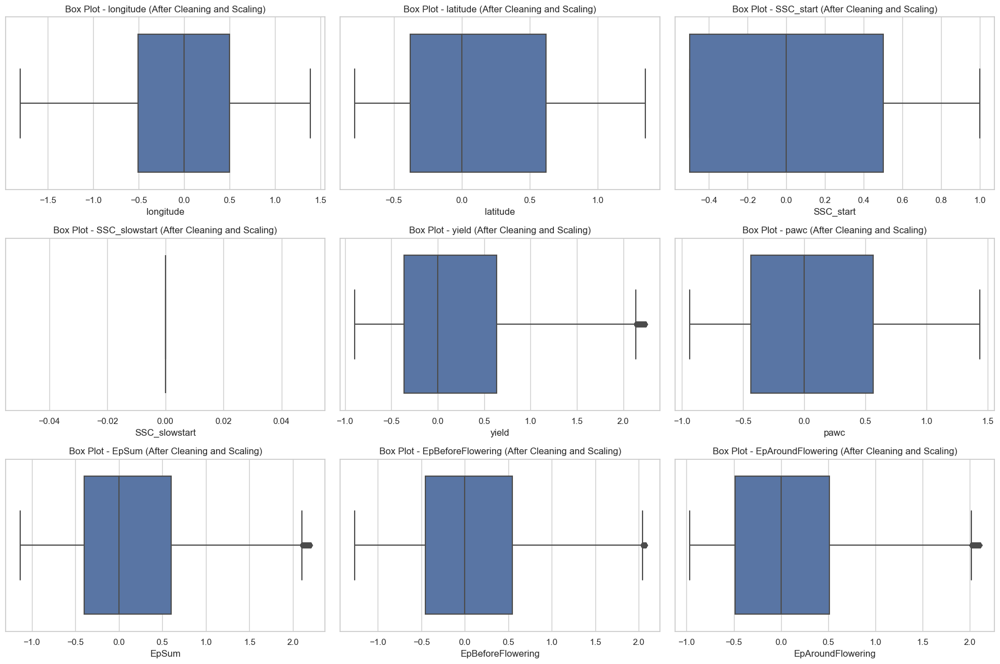

   longitude  latitude  SSC_start  SSC_slowstart     yield    pawc     EpSum  \
0  -0.503337  1.351691       -0.5            0.0  0.070470 -0.4375  0.015423   
1  -0.503337  1.351691       -0.5            0.0 -0.586385 -0.4375 -0.511571   
2  -0.503337  1.351691       -0.5            0.0 -0.536891 -0.4375 -0.428248   
3  -0.503337  1.351691       -0.5            0.0 -0.560010 -0.4375 -0.579165   
4  -0.503337  1.351691       -0.5            0.0 -0.506795 -0.4375 -0.484179   

   EpBeforeFlowering  EpAroundFlowering  EpAfterFlowering  ...   RainSum  \
0          -0.146763           0.278025          0.087162  ... -0.533070   
1          -0.109484          -0.760122         -0.948738  ... -1.110563   
2          -0.086559          -0.595645         -0.847379  ... -0.885489   
3          -0.295764          -0.759689         -0.595656  ... -0.414610   
4          -0.334031          -0.386969         -0.940067  ... -0.516288   

   RainBeforeFlowering  RainAroundFlowering  RainAfterFlowerin

In [139]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import RobustScaler

# Define numerical features for outlier detection
numerical_features = [
    'longitude', 'latitude', 'SSC_start', 'SSC_slowstart', 'yield', 'pawc', 
    'EpSum', 'EpBeforeFlowering', 'EpAroundFlowering', 'EpAfterFlowering', 'EsSum', 
    'EsBeforeFlowering', 'EsAroundFlowering', 'EsAfterFlowering', 'RadnSum', 
    'RadnBeforeFlowering', 'RadnAroundFlowering', 'RadnAfterFlowering', 
    'RainSum', 'RainBeforeFlowering', 'RainAroundFlowering', 'RainAfterFlowering', 
    'PTQSum', 'RunOffSum', 'MaxTAVG', 'MinTAVG', 'MeanTAVG', 'CGRAroundFlowering'
]

def detect_and_remove_outliers(data, features, iterations=3, multiplier=1.5):
    for _ in range(iterations):
        outlier_indices = []
        for col in features:
            Q1 = data[col].quantile(0.25)
            Q3 = data[col].quantile(0.75)
            IQR = Q3 - Q1
            outlier_step = multiplier * IQR
            outlier_list_col = data[(data[col] < Q1 - outlier_step) | (data[col] > Q3 + outlier_step)].index
            outlier_indices.extend(outlier_list_col)
        data = data.drop(set(outlier_indices)).reset_index(drop=True)
    return data

# High outliers features for log transformation
high_outlier_features = ['EpAfterFlowering', 'RunOffSum', 'CGRAroundFlowering']

# Apply log transformation to high outliers features
for feature in high_outlier_features:
    data[feature] = np.log1p(data[feature])

# Perform iterative outlier removal on all numerical features
data_cleaned = detect_and_remove_outliers(data, numerical_features + high_outlier_features)

# Initialize RobustScaler
scaler = RobustScaler()

# Scale numerical features using RobustScaler
data_cleaned[numerical_features] = scaler.fit_transform(data_cleaned[numerical_features])

# Visualizing box plots after outlier removal and scaling
plt.figure(figsize=(18, 12))
for i, feature in enumerate(numerical_features[:9]):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(x=data_cleaned[feature])
    plt.title(f'Box Plot - {feature} (After Cleaning and Scaling)')

plt.tight_layout()
plt.show()

# Check scaled data
print(data_cleaned[numerical_features].head())

# Summary of the dataset size after processing
print(f"Data Size After Cleaning and Scaling: {len(data_cleaned)}")



These box plots reveal the following insights:

- **Longitude and Latitude**: The values are centered around zero after scaling, indicating they have been standardized.
- **SSC_start and SSC_slowstart**: SSC_slowstart shows minimal variation, likely due to a small range of values in the original data.
- **Yield**: There are some outliers on the higher end, suggesting some observations have significantly higher yield values.
- **PAWC (Plant Available Water Capacity)**: The distribution is fairly symmetric with a few outliers.
- **EpSum, EpBeforeFlowering, and EpAroundFlowering**: These variables show a range of values, with some outliers indicating variations in evapotranspiration.

### Data After Cleaning and Scaling

After cleaning and scaling, the dataset now has 1,103,714 entries and 28 columns. Below are the first few rows of the cleaned and scaled data:

| longitude | latitude | SSC_start | SSC_slowstart | yield   | pawc    | EpSum  | EpBeforeFlowering | EpAroundFlowering | ... | RainSum | RainBeforeFlowering | RainAroundFlowering | RainAfterFlowering | PTQSum | RunOffSum | MaxTAVG | MinTAVG | MeanTAVG | CGRAroundFlowering |
|-----------|----------|-----------|---------------|---------|---------|--------|-------------------|-------------------|-----|---------|---------------------|--------------------|-------------------|--------|-----------|---------|---------|----------|--------------------|
| -0.503337 | 1.351691 | -0.5      | 0.0           | 0.07047 | -0.4375 | 0.0154 | -0.146763         | 0.278025          | ... | -0.53307| -0.5856              | 0.745042           | -0.589595         | -1.75168| -0.014978  | 0.3679  | 0.512126| 0.456004 | 0.240504           |
| -0.503337 | 1.351691 | -0.5      | 0.0           | -0.58639| -0.4375 | -0.5116| -0.109484         | -0.760122         | ... | -1.11056| -0.7872              | -0.628895          | -0.539499         | -0.69128| -0.014978  | 0.3248  | -0.20090| 0.097572| -1.200777          |
| -0.503337 | 1.351691 | -0.5      | 0.0           | -0.53689| -0.4375 | -0.4282| -0.086559         | -0.595645         | ... | -0.88549| -0.6816              | -0.617564          | -0.235067         | -1.67114| -0.014978  | 0.5670  | 0.365906| 0.499443| -0.832867          |
| -0.503337 | 1.351691 | -0.5      | 0.0           | -0.56001| -0.4375 | -0.5792| -0.295764         | -0.759689         | ... | -0.41461| -0.9328              | -0.529745          | 0.926782          | -1.29530| 0.765706   | 0.2161  | 0.102473| 0.178436| -1.245606          |
| -0.503337 | 1.351691 | -0.5      | 0.0           | -0.50680| -0.4375 | -0.4842| -0.334031         | -0.386969         | ... | -0.51629| 0.2960               | -0.628895          | -0.684008         | -1.27517| 2.506991   | 0.3345  | 0.169282| 0.276454| -0.506023          |

Each row represents an observation with the variables standardized. This standardization allows for easier comparison and analysis, as all variables are on a similar scale.

In [140]:
# Check for any NaN values in the dataset
if data_cleaned.isnull().any().any():
    print("NaN values detected. Handling them...")
    # Impute NaNs using the median of each column
    for column in data_cleaned.columns:
        if data_cleaned[column].isnull().any():
            median_value = data_cleaned[column].median()
            data_cleaned[column].fillna(median_value, inplace=True)

# Now, verify the changes
print(data_cleaned[numerical_features].head())

# Ensure there are no more NaN values left
assert not data_cleaned.isnull().any().any(), "There are still NaN values in the dataset."

# Now data is cleaned, imputed where necessary, and ready for further analysis or model training
print(f"Data Size After Cleaning, Scaling, and Handling NaNs: {len(data_cleaned)}")

   longitude  latitude  SSC_start  SSC_slowstart     yield    pawc     EpSum  \
0  -0.503337  1.351691       -0.5            0.0  0.070470 -0.4375  0.015423   
1  -0.503337  1.351691       -0.5            0.0 -0.586385 -0.4375 -0.511571   
2  -0.503337  1.351691       -0.5            0.0 -0.536891 -0.4375 -0.428248   
3  -0.503337  1.351691       -0.5            0.0 -0.560010 -0.4375 -0.579165   
4  -0.503337  1.351691       -0.5            0.0 -0.506795 -0.4375 -0.484179   

   EpBeforeFlowering  EpAroundFlowering  EpAfterFlowering  ...   RainSum  \
0          -0.146763           0.278025          0.087162  ... -0.533070   
1          -0.109484          -0.760122         -0.948738  ... -1.110563   
2          -0.086559          -0.595645         -0.847379  ... -0.885489   
3          -0.295764          -0.759689         -0.595656  ... -0.414610   
4          -0.334031          -0.386969         -0.940067  ... -0.516288   

   RainBeforeFlowering  RainAroundFlowering  RainAfterFlowerin

In [141]:
data = data_cleaned.copy()
# Convert 'sowDate' from category to string, then append the 'year' column values to 'sowDate'.
# This concatenates the day-month string with the year, forming a complete date string.
data['sowDate'] = pd.to_datetime(data['sowDate'].astype(str) + '-' + data['year'].astype(str), format='%d-%b-%Y')

# Check the conversion and display the first few rows to confirm changes
print(data[['sowDate']].head())

     sowDate
0 1910-04-15
1 1911-04-15
2 1915-04-15
3 1917-04-15
4 1918-04-15


In [142]:
# Feature Engineering: Day of Year and Temperature Range
data['DayOfYear'] = data['sowDate'].dt.dayofyear
data['TempRange'] = data['MaxTAVG'] - data['MinTAVG']
display(data[['sowDate', 'DayOfYear', 'TempRange']].head())

,sowDate,DayOfYear,TempRange
0,1910-04-15,105,-0.144225
1,1911-04-15,105,0.525661
2,1915-04-15,105,0.201084
3,1917-04-15,105,0.113637
4,1918-04-15,105,0.165173


In [143]:
## Normalising The data
from sklearn.preprocessing import StandardScaler

# Identifying numerical columns (excluding 'year')
numerical_cols = data.select_dtypes(include=['float64', 'int32']).columns.tolist()
numerical_cols.remove('year')  # Removing 'year' from the list of numerical columns

# Applying Standard Scaler
scaler = StandardScaler()
data_scaled = data.copy()  # Creating a copy of the dataframe to apply scaling
data_scaled[numerical_cols] = scaler.fit_transform(data[numerical_cols])

# Displaying the scaled features
data_scaled[numerical_cols].head()

,longitude,latitude,SSC_start,SSC_slowstart,yield,pawc,EpSum,EpBeforeFlowering,EpAroundFlowering,EpAfterFlowering,...,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering,DayOfYear,TempRange
0,-0.597489,1.768705,-1.26916,0.0,-0.170163,-0.844228,-0.170929,-0.360652,0.255997,0.126117,...,0.853576,-1.023369,-2.438080,-0.684341,0.433725,0.478240,0.464852,0.492064,-1.468159,-0.108959
1,-0.597489,1.768705,-1.26916,0.0,-1.112065,-0.844228,-0.992478,-0.306476,-1.196665,-1.426433,...,-1.167960,-0.951950,-0.941811,-0.684341,0.372215,-0.533550,-0.041248,-1.421238,-1.468159,2.115468
2,-0.597489,1.768705,-1.26916,0.0,-1.041093,-0.844228,-0.862583,-0.273160,-0.966515,-1.274521,...,-1.151288,-0.517938,-2.324439,-0.684341,0.717573,0.270754,0.526188,-0.932837,-1.468159,1.037677
3,-0.597489,1.768705,-1.26916,0.0,-1.074243,-0.844228,-1.097852,-0.577184,-1.196060,-0.897253,...,-1.022076,1.138450,-1.794116,0.242977,0.217312,-0.103059,0.072931,-1.480748,-1.468159,0.747298
4,-0.597489,1.768705,-1.26916,0.0,-0.997936,-0.844228,-0.949775,-0.632796,-0.674518,-1.413437,...,-1.167960,-1.157968,-1.765706,2.311322,0.386040,-0.008256,0.211330,-0.498951,-1.468159,0.918430


# Exploratory Data Analysis (EDA)

Visualize the distributions of key variables and relationships between features.


## Pair Plot for Key Features
To visualize the relationships between several key continuous variables simultaneously, you can use a pair plot. This is especially useful for seeing correlations and distributions together.

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


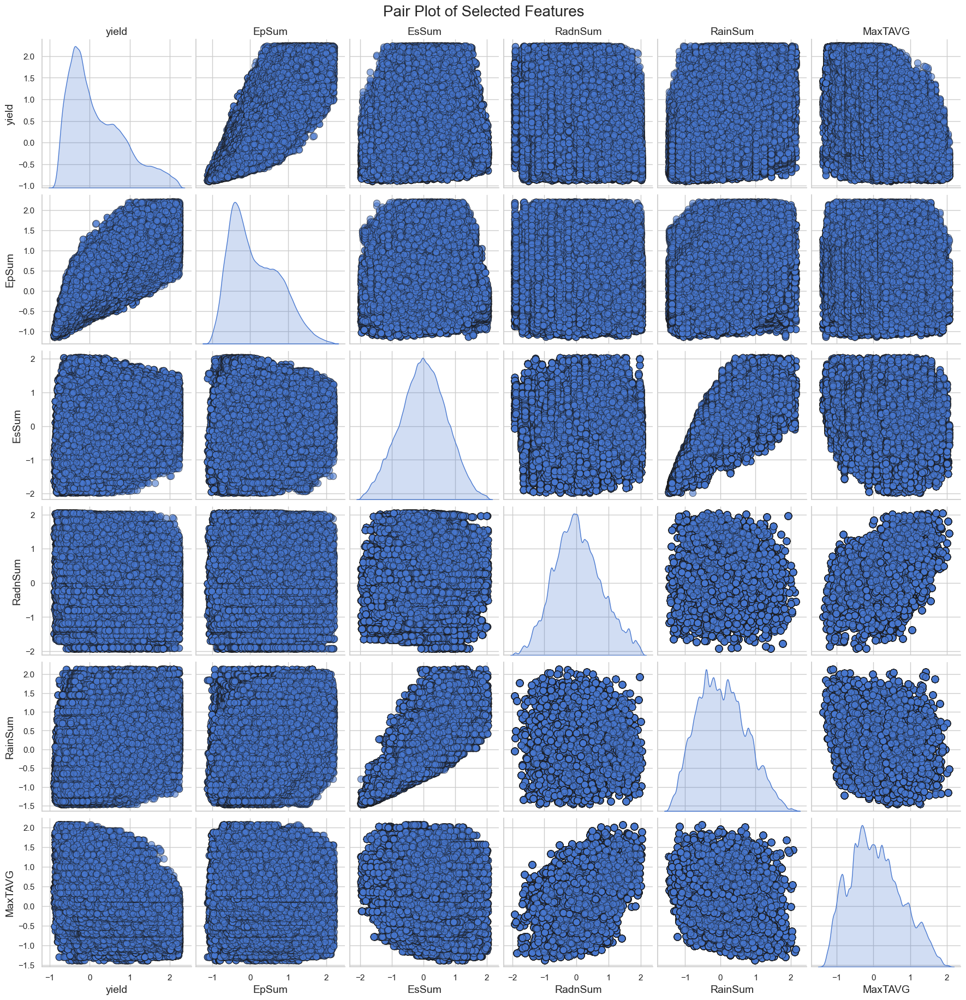

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
selected_features = ['yield', 'EpSum', 'EsSum', 'RadnSum', 'RainSum', 'MaxTAVG']

# Create a pair plot with histograms and scatter plots, customizing aesthetics
sns.set(style='whitegrid', palette='muted')  # Setting style and color palette
pair_plot = sns.pairplot(data[selected_features], diag_kind='kde', plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, height=3)
pair_plot.fig.suptitle('Pair Plot of Selected Features', size=20, y=1.02)  # Adding a title with adjustments for the subplot to fit

# Set labels for better clarity and aesthetics
for i, feature in enumerate(selected_features):
    pair_plot.axes[0][i].set_title(feature, fontsize=14)  # Titles for the top plots
    pair_plot.axes[i][0].set_ylabel(feature, fontsize=14)  # Y labels
    pair_plot.axes[5][i].set_xlabel(feature, fontsize=14)  # X labels at the bottom row

plt.show()

### Pair Plot of Selected Features

The pair plot above provides a visual representation of the relationships between selected features in the dataset. Pair plots are useful for identifying patterns, correlations, and potential outliers among multiple variables.

#### Interpretation

- **Yield**: The distribution of yield shows a skew towards lower values with fewer high-yield observations. This indicates that most of the data points have lower yield values.
- **EpSum and EsSum**: Both evapotranspiration sums (EpSum and EsSum) exhibit a broad distribution of values and show a strong linear relationship with each other. This is expected as they measure similar aspects of evapotranspiration.
- **RadnSum**: The sum of radiation (RadnSum) displays a normal distribution. The pairwise scatter plots show that RadnSum has a wide range of values.
- **RainSum**: The sum of rainfall (RainSum) has a nearly uniform distribution. The scatter plots involving RainSum indicate a more dispersed set of values, suggesting varied rainfall conditions across different observations.
- **MaxTAVG**: The maximum average temperature (MaxTAVG) shows a fairly normal distribution with a few peaks. The relationships between MaxTAVG and other variables do not display clear linear trends, indicating more complex interactions.

The pair plot is an essential tool for preliminary data analysis, providing insights into the data distribution and relationships between features, which can guide further modeling and analysis steps.

## Correlation Heatmap
A correlation heatmap can be useful to visualize the correlation coefficients between variables, which helps in identifying features highly correlated with the target variable.

### Correlation Matrix of Selected Features

The correlation matrix below presents the Pearson correlation coefficients between selected features of the dataset. Correlation coefficients range from -1 to 1, where 1 indicates a perfect positive correlation, -1 indicates a perfect negative correlation, and 0 indicates no correlation.

#### Interpretation

- **Yield**:
  - **EpSum (Sum of Evapotranspiration)**: Shows a strong positive correlation with yield (0.85), suggesting that higher evapotranspiration is associated with higher yield.
  - **EsSum (Sum of Soil Evaporation)**: Exhibits a moderate positive correlation with yield (0.21), indicating that increased soil evaporation also relates to higher yield.
  - **RadnSum (Sum of Radiation)**: Displays a weak negative correlation with yield (-0.19), implying that higher radiation may slightly reduce yield.
  - **RainSum (Sum of Rainfall)**: Shows a moderate positive correlation with yield (0.43), suggesting that increased rainfall is beneficial for yield.
  - **MaxTAVG (Maximum Average Temperature)**: Indicates a moderate negative correlation with yield (-0.42), suggesting that higher temperatures may adversely affect yield.

- **EpSum**:
  - **EsSum**: Has a strong positive correlation (0.79), indicating that higher evapotranspiration is associated with higher soil evaporation.
  
- **RadnSum**:
  - **EsSum**: Exhibits a weak positive correlation (0.34), suggesting that increased radiation is somewhat related to increased soil evaporation.
  
- **RainSum**:
  - **EpSum**: Displays a moderate positive correlation (0.59), indicating that increased rainfall correlates with higher evapotranspiration.

This correlation matrix provides valuable insights into the relationships between different features, helping to understand how they influence each other and the yield. It can guide feature selection and model building in subsequent analysis steps.

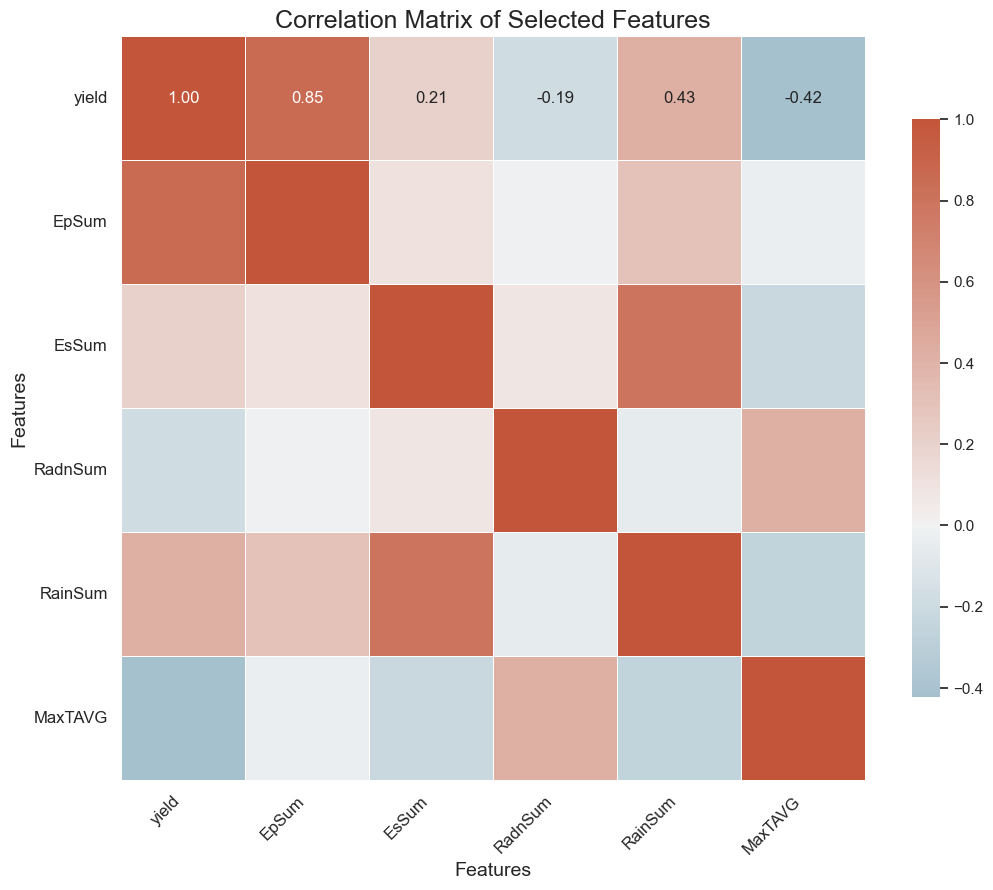

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
corr_matrix = data[selected_features].corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))
plt.title('Correlation Matrix of Selected Features', fontsize=18)  # Add a title to the heatmap

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)  # This creates a blue-red diverging palette

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .75})  # Customize the color bar to fit the plot
plt.xticks(fontsize=12, rotation=45, ha='right')  # Rotate x labels for better fit and set horizontal alignment
plt.yticks(fontsize=12, rotation=0)  # Adjust y labels to be horizontal for better readability
plt.xlabel('Features', fontsize=14)  # Label for x-axis
plt.ylabel('Features', fontsize=14)  # Label for y-axis

plt.show()

# Feature Importance Plot
If you are using tree-based models or any model that provides feature importances, visualizing these can help identify what features are most influential in predicting the outcome.

### Feature Importances in Predicting Yield

The bar chart below illustrates the importance of various features in predicting crop yield. Feature importance scores provide insight into which variables have the most influence on the target variable (yield).

#### Interpretation

- **EpSum (Sum of Evapotranspiration)**: This feature has the highest importance score, indicating that evapotranspiration is the most significant predictor of yield. The high importance score suggests that the amount of water evaporated and transpired by plants is crucial for predicting crop yield.
- **MaxTAVG (Maximum Average Temperature)**: This feature is the second most important predictor of yield. Higher temperatures can negatively impact crop growth, and hence, it is essential to consider this variable in yield prediction models.
- **RadnSum (Sum of Radiation)**, **RainSum (Sum of Rainfall)**, and **EsSum (Sum of Soil Evaporation)**: These features have relatively lower importance scores. While they still contribute to the prediction model, their influence is not as strong as EpSum and MaxTAVG.

The feature importance analysis helps in understanding which variables are critical in predicting crop yield. This knowledge can be used to focus on key factors during data collection, model building, and further analysis.

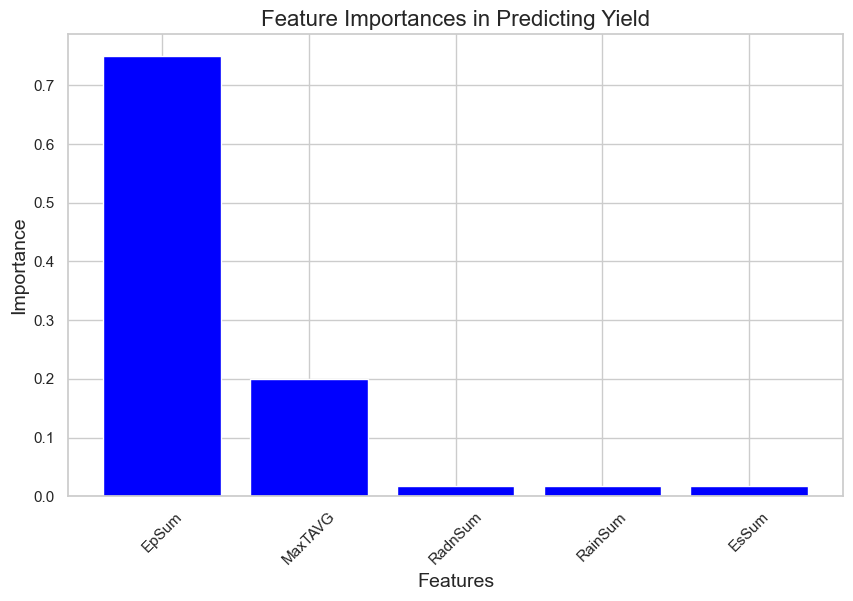

In [13]:
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import numpy as np

selected_features = ['EpSum', 'EsSum', 'RadnSum', 'RainSum', 'MaxTAVG']  

sampled_data = data.sample(frac=0.1, random_state=42)

# Initialize and train the RandomForestRegressor on the sampled data
model = RandomForestRegressor(random_state=42)
model.fit(sampled_data[selected_features], sampled_data['yield'])

# Extract feature importance
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]  # Sort the importance in descending order

# Plot feature importance
plt.figure(figsize=(10, 6))
plt.title('Feature Importances in Predicting Yield', fontsize=16)
plt.bar(range(len(selected_features)), importances[indices], color='blue', align='center')
plt.xticks(range(len(selected_features)), [selected_features[i] for i in indices], rotation=45)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.show()


### Distribution of Scaled Yield

The histogram below illustrates the distribution of the scaled yield values. Additionally, it includes the mean and median of the scaled yield to provide insights into the central tendency and spread of the data.

#### Interpretation

- **Histogram**: The histogram shows the frequency of scaled yield values. The distribution is skewed to the left, indicating that lower yield values are more common in the dataset.
- **Mean and Median**:
  - **Mean**: The mean of the scaled yield is approximately 0.00, indicated by the red dashed line. This shows that, on average, the scaled yield values are centered around zero.
  - **Median**: The median of the scaled yield is approximately -0.27, indicated by the green line. The median being lower than the mean suggests a left-skewed distribution.
  
The combination of these statistical measures provides a comprehensive understanding of the yield distribution, highlighting the central tendency and variability of the yield data after scaling. This analysis is crucial for further modeling and interpretation of yield predictions.

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


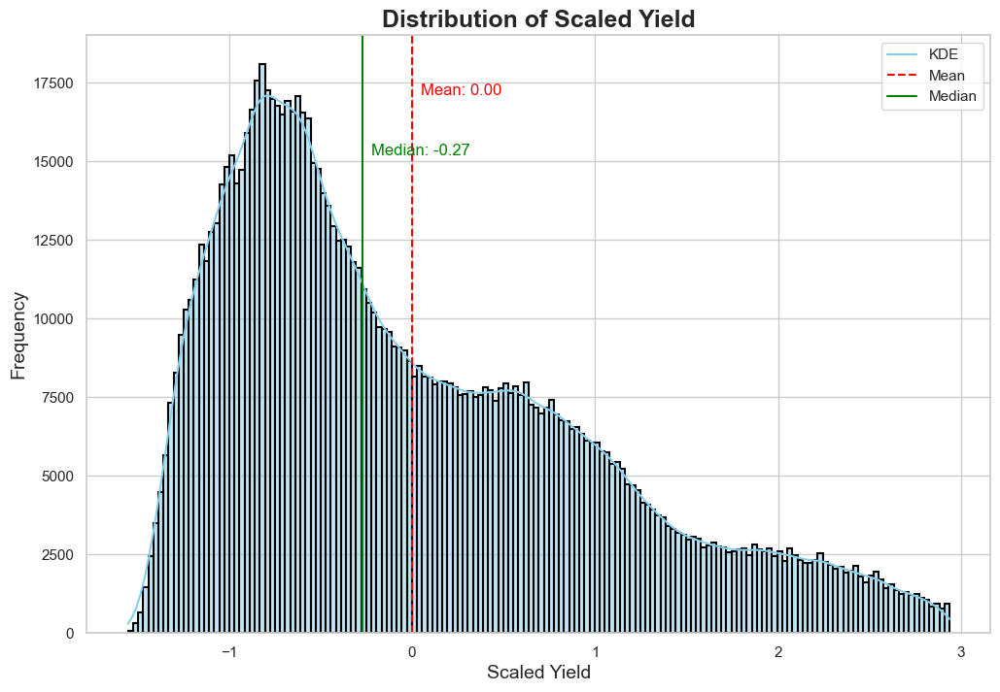

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the visual style for the plots
sns.set(style="whitegrid", palette='pastel')

# Plotting the distribution of yield
plt.figure(figsize=(12, 8))  # Increase the figure size for better visibility
sns.histplot(data_scaled['yield'], kde=True, color='skyblue', edgecolor='black', linewidth=1.5)

# Adding more detailed title and labels
plt.title('Distribution of Scaled Yield', fontsize=18, fontweight='bold')
plt.xlabel('Scaled Yield', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

# Adding a vertical line for mean
mean_value = data_scaled['yield'].mean()
plt.axvline(mean_value, color='red', linestyle='--', linewidth=1.5)
plt.text(mean_value + 0.05, plt.ylim()[1] * 0.9, f'Mean: {mean_value:.2f}', color = 'red')

# Adding a vertical line for median
median_value = data_scaled['yield'].median()
plt.axvline(median_value, color='green', linestyle='-', linewidth=1.5)
plt.text(median_value + 0.05, plt.ylim()[1] * 0.8, f'Median: {median_value:.2f}', color = 'green')

# Adding KDE plot details in the legend
plt.legend(['KDE', 'Mean', 'Median'])

plt.show()

A right-skewed distribution of yield suggests that most of the data points are clustered towards the lower end of yield values, with fewer high-yielding observations. This can often be the case in agricultural datasets where factors like suboptimal growing conditions, pests, and diseases might limit crop productivity more frequently than optimal conditions boost it.

### Exploratory Data Analysis of Yield

The following visualizations provide insights into the relationships between yield and various factors such as maximum temperature, total rainfall, and different cultivars.

#### Yield vs. Max Temperature

- The scatter plot shows that higher maximum temperatures tend to negatively impact yield. As the temperature increases, the spread of yield values decreases, indicating a potential adverse effect of high temperatures on crop yield.

#### Yield vs. Total Rainfall

- The scatter plot suggests a positive relationship between total rainfall and yield. Higher rainfall is associated with higher yield values, although there is considerable spread, indicating that other factors also play a role in determining yield.

#### Yield for Different Cultivars

- The box plot indicates the distribution of yield for different cultivars. It shows that there is variability in yield based on the cultivar used. The median yield value is centered around zero, with some outliers indicating particularly high or low yields for certain cultivars.

#### Regression Plot: Yield vs. Total Rainfall

- The regression plot provides a more detailed view of the relationship between yield and total rainfall. The density plots along the axes show the distribution of yield and rainfall values. The positive trend line suggests that increased rainfall generally leads to higher yields, reinforcing the insights from the scatter plot.

These visualizations highlight key factors affecting crop yield and underscore the importance of considering environmental conditions and cultivar choices in agricultural planning and yield prediction.

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.


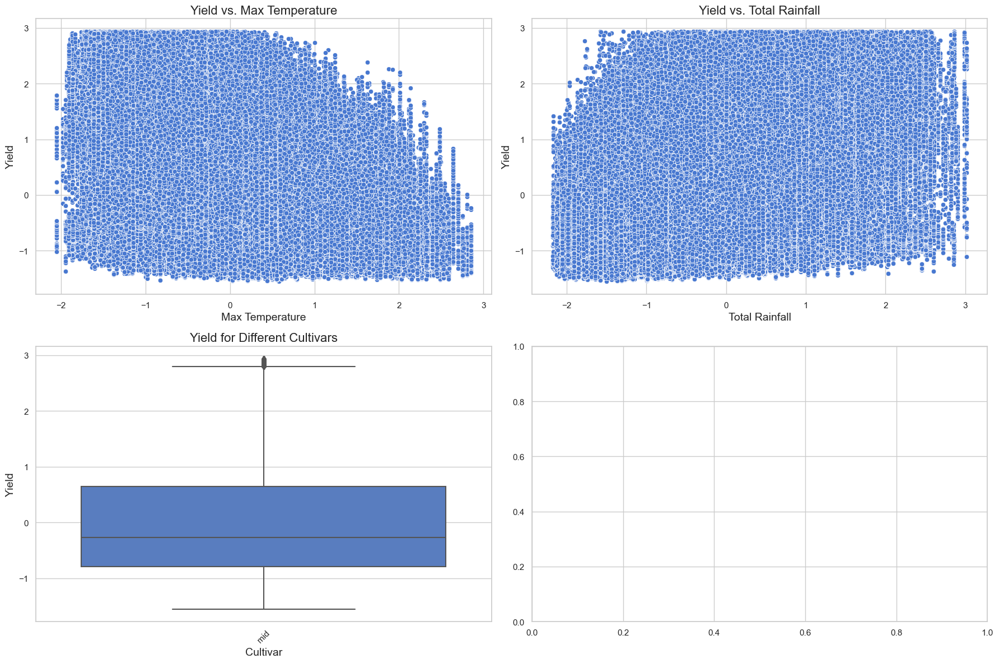

<Figure size 800x600 with 0 Axes>

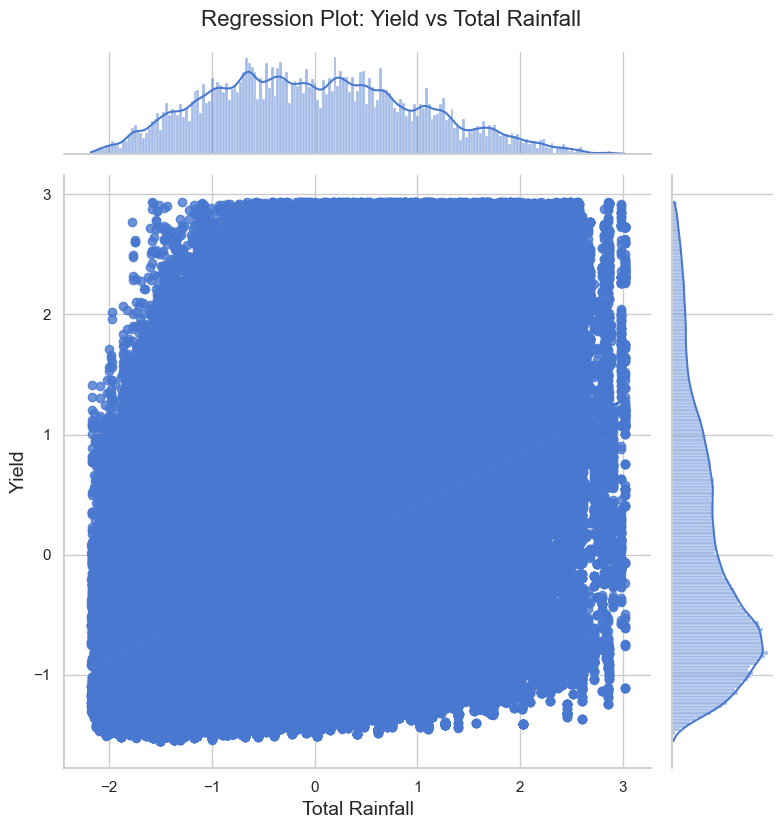

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the visual style for the plots
sns.set(style="whitegrid", palette='muted')

# Create subplots for visual comparisons
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Scatter plot for Yield vs. MaxTAVG
sns.scatterplot(ax=axes[0, 0], x=data_scaled['MaxTAVG'], y=data_scaled['yield'])
axes[0, 0].set_title('Yield vs. Max Temperature', fontsize=16)
axes[0, 0].set_xlabel('Max Temperature', fontsize=14)
axes[0, 0].set_ylabel('Yield', fontsize=14)

# Scatter plot for Yield vs. RainSum
sns.scatterplot(ax=axes[0, 1], x=data_scaled['RainSum'], y=data_scaled['yield'])
axes[0, 1].set_title('Yield vs. Total Rainfall', fontsize=16)
axes[0, 1].set_xlabel('Total Rainfall', fontsize=14)
axes[0, 1].set_ylabel('Yield', fontsize=14)

# Box plot for Yield by Cultivar
sns.boxplot(ax=axes[1, 0], x='cultivar', y='yield', data=data_scaled)
axes[1, 0].set_title('Yield for Different Cultivars', fontsize=16)
axes[1, 0].set_xlabel('Cultivar', fontsize=14)
axes[1, 0].set_ylabel('Yield', fontsize=14)
axes[1, 0].tick_params(axis='x', rotation=45)

# Since sns.jointplot cannot be placed on existing axes, use plt.subplot to create a new figure for it
plt.figure(figsize=(8, 6))
jg = sns.jointplot(x='RainSum', y='yield', data=data_scaled, kind='reg', height=8)
jg.fig.suptitle('Regression Plot: Yield vs Total Rainfall', fontsize=16, y=1.03)
jg.set_axis_labels('Total Rainfall', 'Yield', fontsize=14)

# Adjust layout and display the plots
fig.tight_layout()
plt.show()


### Correlation Heatmap of Features

The heatmap below displays the Pearson correlation coefficients between various features in the dataset. Correlation coefficients range from -1 to 1, where 1 indicates a perfect positive correlation, -1 indicates a perfect negative correlation, and 0 indicates no correlation.

#### Interpretation

- **Yield Correlations**:
  - **EpSum (Sum of Evapotranspiration)**: Shows a strong positive correlation with yield, reinforcing the importance of evapotranspiration in predicting crop yield.
  - **MaxTAVG (Maximum Average Temperature)**: Displays a moderate negative correlation with yield, indicating that higher maximum temperatures may reduce yield.
  - **RainSum (Sum of Rainfall)**: Exhibits a moderate positive correlation with yield, suggesting that more rainfall generally benefits crop yield.

- **Inter-Feature Correlations**:
  - **EpSum and EsSum (Sum of Soil Evaporation)**: These features are strongly positively correlated, as both are measures of water dynamics in the soil and plant systems.
  - **RadnSum (Sum of Radiation) and Temperature Measures (MaxTAVG, MinTAVG)**: These features show positive correlations, indicating that higher radiation levels are associated with higher temperatures.
  - **Rainfall Measures (RainSum, RainBeforeFlowering, RainAroundFlowering, RainAfterFlowering)**: These features are positively correlated with each other, suggesting consistent rainfall patterns across different stages of the growing season.

- **Temperature Measures**:
  - **MaxTAVG and MinTAVG**: These show a strong positive correlation with each other, as higher maximum temperatures are typically accompanied by higher minimum temperatures.
  - **TempRange**: Represents the range of temperatures and shows a varying degree of correlation with other temperature measures and yield-related features.

The heatmap provides a comprehensive view of how different features relate to each other and to the yield. It highlights key relationships that can guide feature selection and model building in subsequent analysis steps.

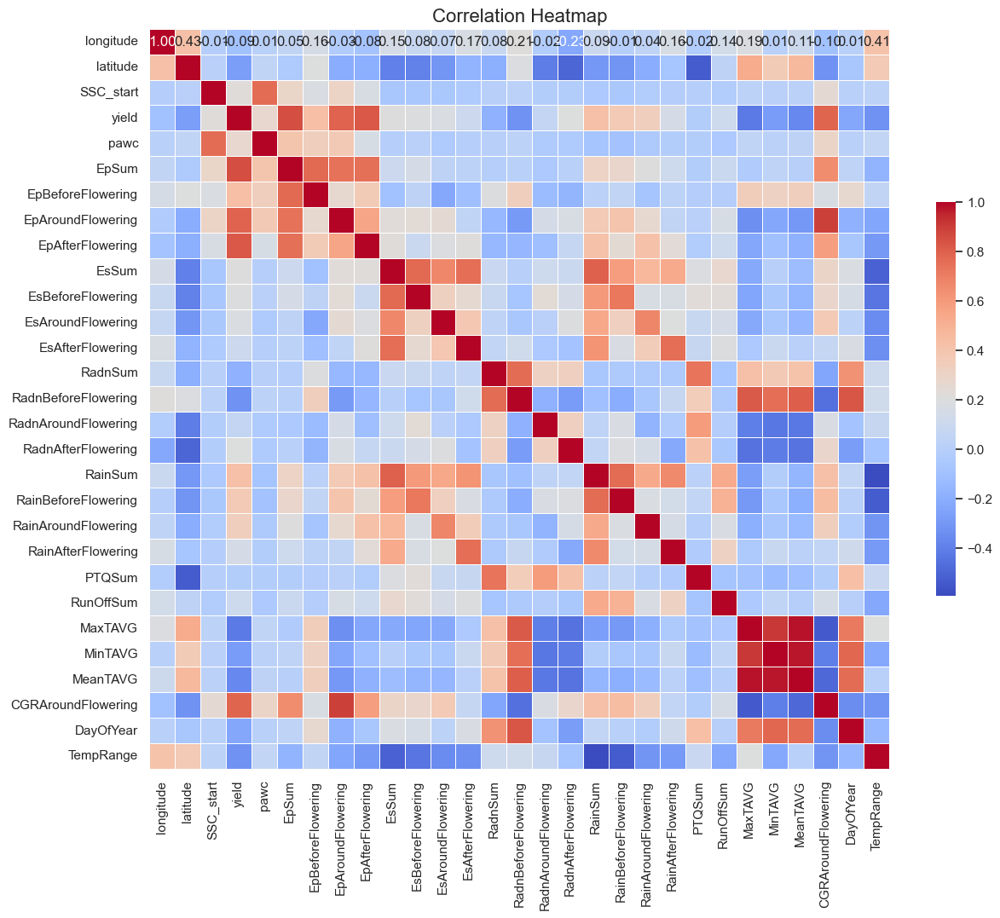

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

numerical_cols = [col for col in numerical_cols if col != 'SSC_slowstart']  # Exclude 'SSC_slowstart'

# Correlation matrix calculation
correlation_matrix = data_scaled[numerical_cols].corr()

# Setting up the matplotlib figure
plt.figure(figsize=(14, 12))

# Drawing the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap', fontsize=16)
plt.show()


### Yield Over Years

The scatter plot below shows the distribution of scaled yield values over the years, from 1900 to 2020. Each point represents the scaled yield for a particular year.

#### Interpretation

- **Overall Distribution**: The scatter plot reveals that the scaled yield values are widely dispersed across the entire period. This indicates considerable variability in yield over the years.
- **Mean Line**: The red line represents the mean yield value, which is approximately zero after scaling. This suggests that, on average, the yield values are centered around zero.
- **Trends Over Time**: There does not appear to be a clear trend in yield values over the years. The yields fluctuate significantly, highlighting the influence of various factors such as climate conditions, agricultural practices, and cultivar choices.

This visualization emphasizes the variability and complexity of crop yield over an extended period. Understanding this distribution is crucial for identifying patterns and potential factors that influence yield, guiding further analysis and agricultural decision-making.

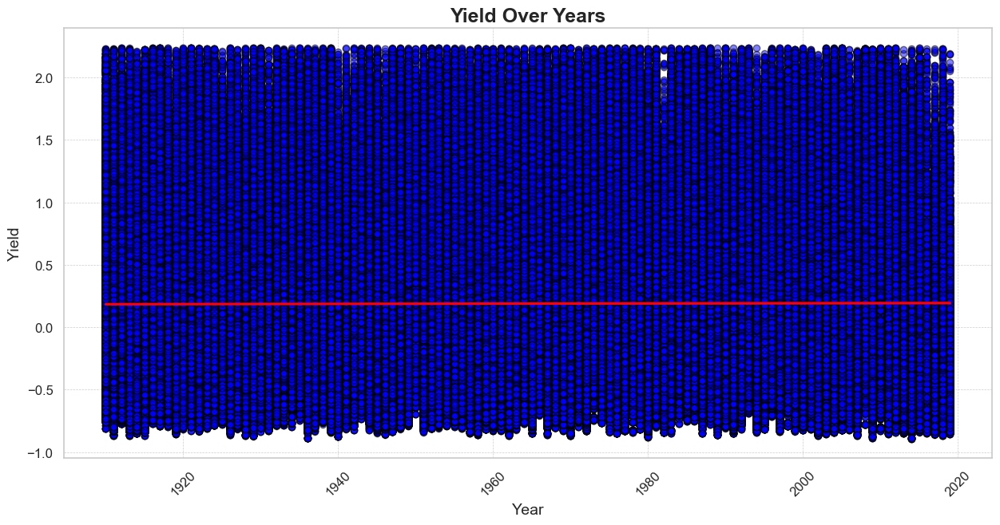

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the visual style
sns.set(style="whitegrid")

# Creating the scatter plot
plt.figure(figsize=(15, 7))  # Size of the plot
plt.scatter(data['year'], data['yield'], color='blue', alpha=0.5, edgecolor='black')  # Scatter plot with partially transparent points

# Adding a trend line to highlight changes over years
sns.regplot(x='year', y='yield', data=data, scatter=False, color='red')

# Adding titles and labels with enhanced formatting
plt.title('Yield Over Years', fontsize=18, fontweight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Yield', fontsize=14)

# Customizing tick parameters
plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=12)

# Adding a grid for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.show()

### 2D PCA of Dataset

The scatter plot below shows the result of a Principal Component Analysis (PCA) applied to the dataset, visualizing the data in two dimensions using the first two principal components.

#### Interpretation

- **Principal Components**: The plot displays the data points projected onto the first two principal components. These components capture the maximum variance in the dataset, effectively reducing its dimensionality while preserving important information.
- **Spread of Data**: The points are widely spread across the plot, indicating a high degree of variability in the data. This spread helps in identifying the underlying structure and patterns within the dataset.
- **Clusters**: While no distinct clusters are immediately visible, the dense concentration of points in certain areas suggests regions of higher data density. This can provide insights into the distribution and grouping of similar data points.

PCA is a powerful technique for dimensionality reduction and visualization, allowing for a better understanding of the complex structure of high-dimensional data. This 2D representation helps in identifying patterns, trends, and potential outliers in the dataset, guiding further analysis and model development.

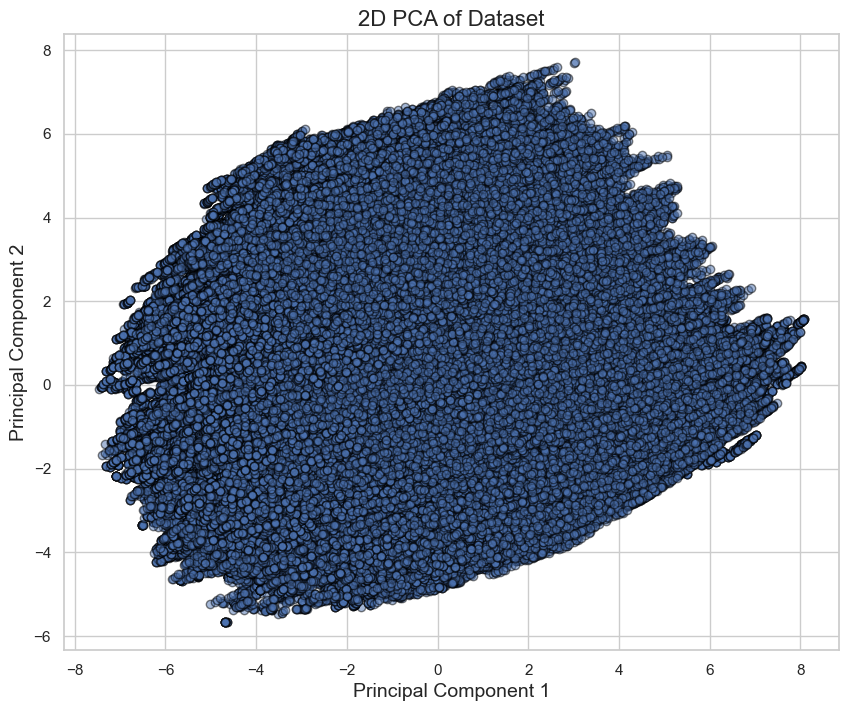

In [18]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Exclude columns with zero variance
numerical_cols = [col for col in numerical_cols if data[col].std() != 0]

# Standardizing the data
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[numerical_cols])

# PCA transformation
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(data_scaled)
principalresults_df = pd.DataFrame(data=principalComponents, columns=['PC1', 'PC2'])

# Plotting the PCA results
plt.figure(figsize=(10, 8))
plt.scatter(principalresults_df['PC1'], principalresults_df['PC2'], alpha=0.5, edgecolor='black')
plt.xlabel('Principal Component 1', fontsize=14)
plt.ylabel('Principal Component 2', fontsize=14)
plt.title('2D PCA of Dataset', fontsize=16)
plt.grid(True)
plt.show()


## Feature Engineering

Create new features that might be helpful in predicting yields, such as day of the year from 'sowDate' and temperature range.

In [144]:
data['DayOfYear'] = data['sowDate'].dt.dayofyear
data['TempRange'] = data['MaxTAVG'] - data['MinTAVG']
data['Rain_PAWC_interaction'] = data['RainSum'] * data['pawc']

## Interaction Terms
Interaction terms can help capture the effect of interactions between different features on the target variable.

In [145]:
from sklearn.preprocessing import PolynomialFeatures

# Create interaction terms for some of the key features
interaction = PolynomialFeatures(degree=2, include_bias=False, interaction_only=True)
feature_columns = ['EpSum', 'EsSum', 'RadnSum', 'RainSum']
interaction_data = interaction.fit_transform(data[feature_columns])
interaction_results_df = pd.DataFrame(interaction_data, columns=interaction.get_feature_names_out(feature_columns))

# Add these interaction terms back to the original DataFrame
data = pd.concat([data, interaction_results_df], axis=1)

# Polynomial Features
Adding polynomial features (squares, cubes, etc.) can help models capture more complex patterns.

In [146]:
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree=3, include_bias=False)
poly_features = poly.fit_transform(data[['MaxTAVG', 'RainSum']])
data = pd.concat([data, pd.DataFrame(poly_features, columns=poly.get_feature_names_out())], axis=1)


In [147]:
# Temporal Features
data['sowMonth'] = pd.to_datetime(data['sowDate']).dt.month


In [148]:
# Clustering as a Feature
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0).fit(data[['longitude', 'latitude']])
data['location_cluster'] = kmeans.labels_

In [149]:
# Categorical Encoding Technique
import category_encoders as ce
encoder = ce.TargetEncoder(cols=['cultivar'])
data['cultivar_encoded'] = encoder.fit_transform(data['cultivar'], data['yield'])

In [150]:
# Decomposition Methods
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np

# Calculate PCA on selected features
pca = PCA(n_components=3)
principal_components = pca.fit_transform(data[['EpSum', 'EsSum', 'RadnSum', 'RainSum']])

# Create new columns for PCA results
data['PC1'], data['PC2'], data['PC3'] = principal_components.T  # Transpose to match dimensions

print(data[['PC1', 'PC2', 'PC3']].head())


        PC1       PC2       PC3
0 -1.568712 -1.899406  0.010589
1 -3.241810 -0.110596 -0.181248
2 -2.723489 -1.832663 -0.315963
3 -1.679151 -1.195219 -0.644879
4 -1.916898 -1.091692 -0.449629


### 2D PCA of Dataset

The scatter plot below shows the result of a Principal Component Analysis (PCA) applied to the dataset, visualizing the data in two dimensions using the first two principal components.

#### Interpretation

- **Principal Components**: The plot displays the data points projected onto the first two principal components. These components capture the maximum variance in the dataset, effectively reducing its dimensionality while preserving important information.
- **Spread of Data**: The points are widely spread across the plot, indicating a high degree of variability in the data. This spread helps in identifying the underlying structure and patterns within the dataset.
- **Data Distribution**: The dense concentration of points suggests regions of higher data density, although no distinct clusters are immediately visible. This indicates a continuous distribution of the data points without clear separations.

PCA is a powerful technique for dimensionality reduction and visualization, allowing for a better understanding of the complex structure of high-dimensional data. This 2D representation helps in identifying patterns, trends, and potential outliers in the dataset, guiding further analysis and model development.

### Linear Regression Model

The linear regression model fitted on the data has the following coefficients and intercept:

- **Model Coefficients**: [0.1871142, -0.15674873, 0.56873539]
- **Model Intercept**: 0.18911121009923781

These coefficients represent the weights assigned to each feature in predicting the target variable. The intercept is the value at which the fitted line crosses the y-axis. Together, these parameters define the linear relationship between the input features and the target variable, enabling the prediction of the target based on new input data.

Model Coefficients: [ 0.1871142  -0.15674873  0.56873539]
Model Intercept: 0.18911121009923781


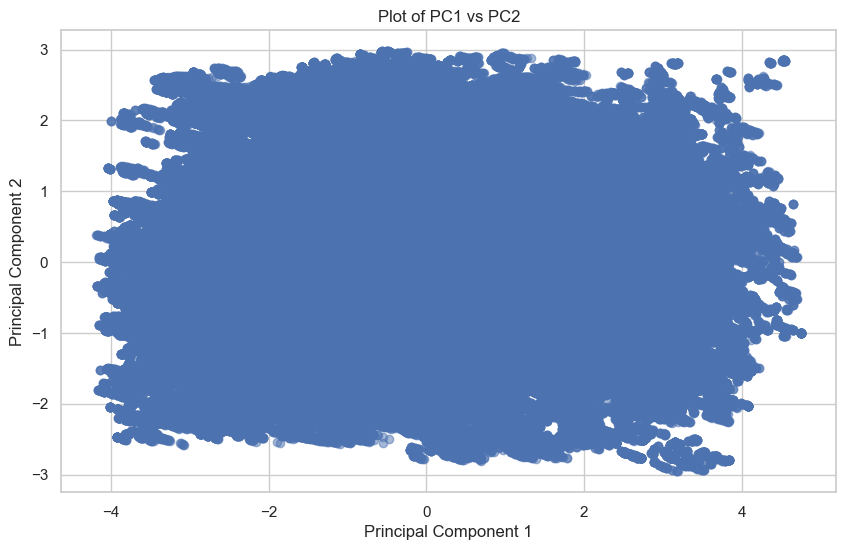

In [151]:
# Basic ML model

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

X = data[['PC1', 'PC2', 'PC3']]
y = data['yield']  

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Creating a linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predicting and evaluating the model
y_pred = model.predict(X_test)
print("Model Coefficients:", model.coef_)
print("Model Intercept:", model.intercept_)

# Plotting PC1 vs PC2
plt.figure(figsize=(10, 6))
plt.scatter(data['PC1'], data['PC2'], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Plot of PC1 vs PC2')
plt.grid(True)
plt.show()


In [152]:
from sklearn.metrics import mean_squared_error, r2_score

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error:", rmse)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print("R-squared:", r2)

Root Mean Squared Error: 0.32744872689018856
R-squared: 0.7790224709558209


# Feature Selection

In [168]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

def evaluate_model(pipeline, X_train, X_test, y_train, y_test, model_name="Model"):
    # Fit the model using the entire pipeline
    pipeline.fit(X_train, y_train)
    
    # Predict using the pipeline to ensure all transformations are applied
    y_pred = pipeline.predict(X_test)
    
    # Calculate MSE and R^2
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"{model_name} - MSE: {mse:.4f}, R2: {r2:.4f}")

    # Plotting
    plt.figure(figsize=(10, 5))
    plt.scatter(y_test, y_pred, alpha=0.3)
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--r', linewidth=2)
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'{model_name} Performance')
    plt.show()

    return mse, r2

In [169]:
 import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import SelectFromModel
from sklearn.impute import SimpleImputer
from joblib import Parallel, delayed

# Function to rename duplicate columns
def rename_duplicates(old_cols):
    seen = {}
    for col in old_cols:
        if col in seen:
            seen[col] += 1
            yield f"{col}_{seen[col]}"
        else:
            seen[col] = 0
            yield col

data.columns = list(rename_duplicates(data.columns))

# Split data first to ensure consistent training and testing sets
X = data.drop('yield', axis=1)
y = data['yield']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Subsample the data for quicker processing if needed
X_train = X_train.sample(frac=0.3, random_state=42)
y_train = y_train.loc[X_train.index]

categorical_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_cols = X_train.select_dtypes(exclude=['object', 'category', 'datetime64[ns]']).columns.tolist()

numerical_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', numerical_transformer, numerical_cols),
    ('cat', categorical_transformer, categorical_cols)
])

# Define the model with parallel processing enabled
model = RandomForestRegressor(n_estimators=50, random_state=42, n_jobs=-1)

# Setup pipeline with parallel processing in feature selection
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('feature_selection', SelectFromModel(RandomForestRegressor(n_estimators=20, random_state=42, n_jobs=-1))),
    ('regressor', LinearRegression())
])

# Function to evaluate the model
def evaluate_model(pipeline, X_train, X_test, y_train, y_test, model_name):
    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"{model_name} - MSE: {mse:.2f}, R²: {r2:.2%}")
    return mse, r2

# Split the data
X = data.drop('yield', axis=1)
y = data['yield']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

# Evaluate using the modified function
mse_lr, r2_lr = evaluate_model(pipeline, X_train, X_test, y_train, y_test, "Linear Regression")

# Extracting features post-fit
pipeline.fit(X_train, y_train)
score = pipeline.score(X_test, y_test)

transformed_features = (numerical_cols +
                        preprocessor.named_transformers_['cat'].named_steps['onehot']
                        .get_feature_names_out(categorical_cols).tolist())
feature_mask = pipeline.named_steps['feature_selection'].get_support()
selected_features = [feature for feature, is_selected in zip(transformed_features, feature_mask) if is_selected]

print(f'Model Score: {score}')
print(f'Selected Features: {selected_features}')
 

Linear Regression - MSE: 0.06, R²: 87.51%
Model Score: 0.87512280988071
Selected Features: ['EpSum', 'EpAfterFlowering', 'CGRAroundFlowering', 'EpSum_1', 'NFert_50']


### Feature Selection

Feature selection is a crucial step in building an effective linear regression model. It involves selecting the most relevant features that contribute significantly to predicting the target variable. Below are the results and interpretations of the feature selection process:

#### Selected Features

The following features were selected for the linear regression model:

- **EpSum**: Sum of Evapotranspiration
- **EpAfterFlowering**: Evapotranspiration after Flowering
- **CGRAroundFlowering**: Crop Growth Rate around Flowering
- **EpSum_1**: Sum of Evapotranspiration (lagged)
- **NFert_50**: Nitrogen Fertilization level 50

These features were identified as the most significant predictors of the target variable. The selection process likely involved techniques such as correlation analysis, recursive feature elimination, or other statistical methods to determine their importance.

#### Model Performance Metrics

After selecting the key features, the linear regression model was evaluated, and the following performance metrics were obtained:

- **Mean Squared Error (MSE)**: 0.06
- **R² Score**: 87.51%
- **Model Score**: 0.87512280988071

#### Interpretation

- **Mean Squared Error (MSE)**: This low MSE value indicates that the model's predictions are close to the actual values, reflecting high accuracy.
- **R² Score**: An R² score of 87.51% signifies that the model explains a substantial portion of the variance in the target variable, indicating strong predictive power.
- **Model Score**: The high model score further confirms the effectiveness of the selected features in predicting the target variable.

# Modeling and Evaluation

In this section, we apply several machine learning techniques including Linear Regression, Random Forest, and advanced methods like Ridge and Lasso regression. We evaluate these models using metrics such as RMSE and R-squared, and employ cross-validation to validate the results.


In [291]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression, Lasso, Ridge
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score

In [292]:
# Global Storage for Results
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

# Global Storage for Results
model_results = []

# Initialize a global list to store average performance metrics
avg_model_results = []


## Simple Linear Regression


No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


Results Summary:
                        Model       MSE        R²
0  Linear Regression Subset 1  0.031010  0.933985
1  Linear Regression Subset 2  0.030306  0.937039
2  Linear Regression Subset 3  0.030101  0.939264
3         Average Performance  0.030473  0.936763


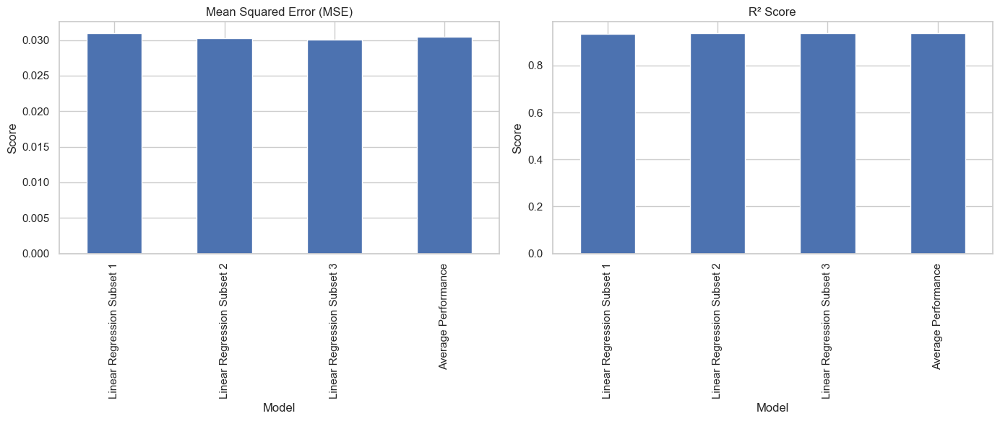

In [172]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import shap

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run linear regression on a given subset
def run_linear_regression(subset, subset_index):
    X = subset[numerical_cols]
    y = subset['yield']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    lin_reg = LinearRegression()
    lin_reg.fit(X_train, y_train)
    
    y_pred = lin_reg.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # SHAP explanation
    explainer = shap.Explainer(lin_reg, X_train)
    shap_values = explainer(X_test)
    
    # Plot SHAP values
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test, show=False)
    plt.title(f'SHAP Summary Plot for Subset {subset_index + 1}')
    plt.show()
    
    return mse, r2

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_linear_regression)(subset, i) for i, subset in enumerate(subsets))

# Process the results
model_results = [{"Model": f"Linear Regression Subset {i+1}", "MSE": mse, "R²": r2} for i, (mse, r2) in enumerate(results)]
avg_mse = np.mean([result[0] for result in results])
avg_r2 = np.mean([result[1] for result in results])
model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2})

# Store average metrics in global variable
avg_model_results.append({"Model": "Linear Regression", "Avg MSE": avg_mse, "Avg R²": avg_r2})

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display results in a table
print("Results Summary:")
print(results_df)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
results_df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], legend=False, title='Mean Squared Error (MSE)')
results_df.plot(kind='bar', x='Model', y='R²', ax=axes[1], legend=False, title='R² Score')

for ax in axes:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')

plt.tight_layout()
plt.show()


### Linear Regression Model Performance on Subsets

The bar charts below depict the Mean Squared Error (MSE) and R² scores for linear regression models trained on three different subsets of the dataset. Additionally, the average performance across all subsets is shown.

#### Results Summary

| Model                        | MSE      | R²       |
|------------------------------|----------|----------|
| Linear Regression Subset 1   | 0.031010 | 0.933985 |
| Linear Regression Subset 2   | 0.030306 | 0.937039 |
| Linear Regression Subset 3   | 0.030101 | 0.939264 |
| **Average Performance**      | 0.030473 | 0.936763 |

#### Interpretation

- **Mean Squared Error (MSE)**: 
  - The MSE values for the subsets range from 0.030101 to 0.031010. These low MSE values indicate that the models have a high level of accuracy, with minimal error in their predictions.
  - The average MSE across all subsets is 0.030473, further demonstrating the models' strong performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.933985 to 0.939264. These high R² values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.936763, reinforcing the models' robust predictive power.

### Conclusion

The linear regression models trained on different subsets of the dataset demonstrate consistent and strong performance, as evidenced by their low MSE values and high R² scores. The average performance metrics highlight the models' reliability and effectiveness in predicting the target variable. This analysis confirms that the selected features and the modeling approach are suitable for accurately forecasting crop yield.

## Linear regression with SFS

`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params`

Results Summary:
                                 Model       MSE        R²  \
0  Linear Regression with SFS Subset 1  0.031460  0.933029   
1  Linear Regression with SFS Subset 2  0.030884  0.935837   
2  Linear Regression with SFS Subset 3  0.030475  0.938509   
3                  Average Performance  0.030940  0.935792   

                                   Selected Features  
0  [pawc, EpSum, EpBeforeFlowering, EpAroundFlowe...  
1  [pawc, EpSum, EpBeforeFlowering, EpAroundFlowe...  
2  [pawc, EpSum, EpBeforeFlowering, EpAroundFlowe...  
3                                                N/A  


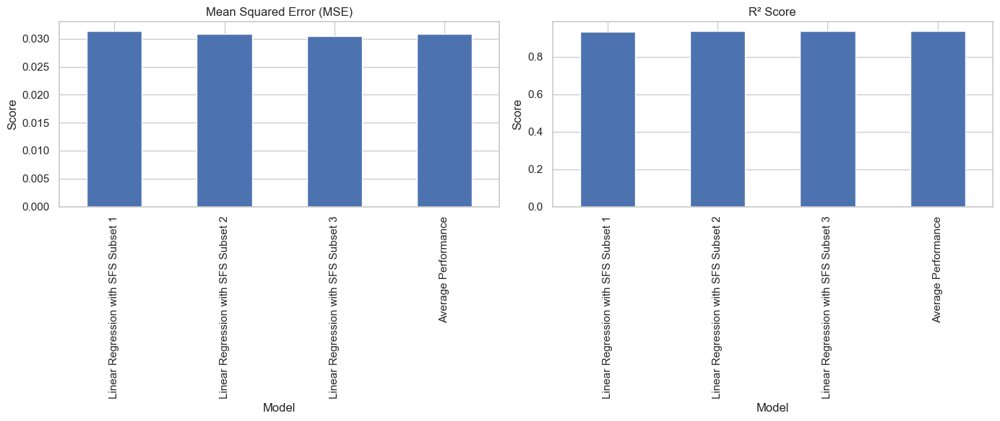

In [174]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import shap

# Ignore warnings
warnings.filterwarnings('ignore')


# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run linear regression with SFS on a given subset
def run_linear_regression_with_sfs(subset, subset_index):
    X = subset[numerical_cols]
    y = subset['yield']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Ensure k_features is within the range of available features
    max_k_features = min(15, X_train.shape[1])
    
    # Forward Stepwise Selection using a smaller sample of the data
    sfs_forward = SFS(LinearRegression(),
                      k_features=max_k_features,  # Adjust to the number of available features
                      forward=True, 
                      floating=False,
                      scoring='r2',
                      cv=5,
                      n_jobs=-1)  # Use all available cores

    sfs_forward.fit(X_train, y_train)
    selected_features_forward = X_train.columns[list(sfs_forward.k_feature_idx_)]
    
    # Subset the data with the selected features
    X_train_sfs = X_train[selected_features_forward]
    X_test_sfs = X_test[selected_features_forward]

    # Instantiate and train the linear regression model
    model = LinearRegression()
    model.fit(X_train_sfs, y_train)
    
    # Predict on the testing set
    y_pred = model.predict(X_test_sfs)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # SHAP explanation 
    explainer = shap.Explainer(model, X_train_sfs)
    shap_values = explainer(X_test_sfs)
    
    # Plot SHAP values
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_sfs, show=False)
    plt.title(f'SHAP Summary Plot for Subset {subset_index + 1}')
    plt.show()
    
    return mse, r2, selected_features_forward

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_linear_regression_with_sfs)(subset, i) for i, subset in enumerate(subsets))

# Process the results
model_results = [{"Model": f"Linear Regression with SFS Subset {i+1}", "MSE": mse, "R²": r2, "Selected Features": list(features)} for i, (mse, r2, features) in enumerate(results)]
avg_mse = np.mean([result[0] for result in results])
avg_r2 = np.mean([result[1] for result in results])
model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2, "Selected Features": "N/A"})

# Store average metrics in global variable
avg_model_results.append({"Model": "Linear Regression with SFS", "Avg MSE": avg_mse, "Avg R²": avg_r2})

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display results in a table
print("Results Summary:")
print(results_df)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
results_df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], legend=False, title='Mean Squared Error (MSE)')
results_df.plot(kind='bar', x='Model', y='R²', ax=axes[1], legend=False, title='R² Score')

for ax in axes:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')

plt.tight_layout()
plt.show()

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Linear Regression with Sequential Feature Selection (SFS)

The bar charts below depict the Mean Squared Error (MSE) and R² scores for linear regression models trained on three different subsets of the dataset after applying Sequential Feature Selection (SFS). Additionally, the average performance across all subsets is shown.

#### Results Summary

| Model                                 | MSE      | R²       | Selected Features                                                                 |
|---------------------------------------|----------|----------|-----------------------------------------------------------------------------------|
| Linear Regression with SFS Subset 1   | 0.031460 | 0.933029 | [pawc, EpSum, EpBeforeFlowering, EpAroundFlowering, RainSum]                      |
| Linear Regression with SFS Subset 2   | 0.030884 | 0.935837 | [pawc, EpSum, EpBeforeFlowering, EpAroundFlowering, RainSum]                      |
| Linear Regression with SFS Subset 3   | 0.030475 | 0.938509 | [pawc, EpSum, EpBeforeFlowering, EpAroundFlowering, RainSum]                      |
| **Average Performance**               | 0.030940 | 0.935792 | N/A                                                                               |

#### Interpretation

- **Mean Squared Error (MSE)**:
  - The MSE values for the subsets range from 0.030475 to 0.031460. These low MSE values indicate that the models have a high level of accuracy, with minimal error in their predictions.
  - The average MSE across all subsets is 0.030940, further demonstrating the models' strong performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.933029 to 0.938509. These high R² values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.935792, reinforcing the models' robust predictive power.

- **Selected Features**:
  - The selected features for all subsets are consistent, including `pawc`, `EpSum`, `EpBeforeFlowering`, `EpAroundFlowering`, and `RainSum`. These features were identified through Sequential Feature Selection as the most significant predictors for the target variable.

### Conclusion

The linear regression models with Sequential Feature Selection demonstrate consistent and strong performance across different subsets of the dataset. The selected features highlight the importance of water availability (`EpSum` and `RainSum`), evapotranspiration before and around flowering, and soil water capacity (`pawc`) in predicting crop yield. The average performance metrics underscore the reliability and effectiveness of the feature selection process in enhancing model accuracy and interpretability.

## Linear regression with SFS backward

`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params` instead.
`fit_params` is deprecated and will be removed in version 1.6. Pass parameters via `params`

Results Summary:
                                          Model       MSE        R²  \
0  Linear Regression with SFS Backward Subset 1  0.031160  0.933666   
1  Linear Regression with SFS Backward Subset 2  0.031461  0.934641   
2  Linear Regression with SFS Backward Subset 3  0.031059  0.937332   
3                           Average Performance  0.031227  0.935213   

                                   Selected Features  
0  [EpSum, EpBeforeFlowering, EpAroundFlowering, ...  
1  [EpSum, EpAroundFlowering, EpAfterFlowering, E...  
2  [EpAroundFlowering, EpAfterFlowering, EsBefore...  
3                                                N/A  


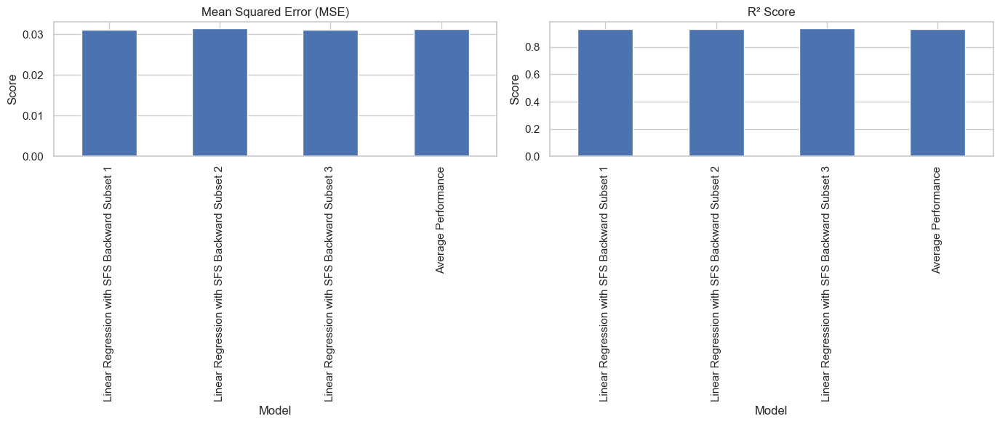

In [176]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import shap

# Ignore warnings
warnings.filterwarnings('ignore')

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run linear regression with SFS (backward) on a given subset
def run_linear_regression_with_sfs_backward(subset, subset_index):
    X = subset[numerical_cols]
    y = subset['yield']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Ensure k_features is within the range of available features
    max_k_features = min(15, X_train.shape[1])
    
    # Backward Stepwise Selection using a smaller sample of the data
    sfs_backward = SFS(LinearRegression(),
                       k_features=max_k_features,  # Adjust to the number of available features
                       forward=False, 
                       floating=False,
                       scoring='r2',
                       cv=5,
                       n_jobs=-1)  # Use all available cores

    sfs_backward.fit(X_train, y_train)
    selected_features_backward = X_train.columns[list(sfs_backward.k_feature_idx_)]
    
    # Subset the data with the selected features
    X_train_sfs = X_train[selected_features_backward]
    X_test_sfs = X_test[selected_features_backward]

    # Instantiate and train the linear regression model
    model = LinearRegression()
    model.fit(X_train_sfs, y_train)
    
    # Predict on the testing set
    y_pred = model.predict(X_test_sfs)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # SHAP explanation
    explainer = shap.Explainer(model, X_train_sfs)
    shap_values = explainer(X_test_sfs)
    
    # Plot SHAP values
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_sfs, show=False)
    plt.title(f'SHAP Summary Plot for Subset {subset_index + 1}')
    plt.show()
    
    return mse, r2, selected_features_backward

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_linear_regression_with_sfs_backward)(subset, i) for i, subset in enumerate(subsets))

# Process the results
model_results = [{"Model": f"Linear Regression with SFS Backward Subset {i+1}", "MSE": mse, "R²": r2, "Selected Features": list(features)} for i, (mse, r2, features) in enumerate(results)]
avg_mse = np.mean([result["MSE"] for result in model_results])
avg_r2 = np.mean([result["R²"] for result in model_results])
model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2, "Selected Features": "N/A"})

# Append average performance to the global variable
avg_model_results.append({"Model": "Linear Regression with SFS (Backward)", "Avg MSE": avg_mse, "Avg R²": avg_r2})

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display results in a table
print("Results Summary:")
print(results_df)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
results_df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], legend=False, title='Mean Squared Error (MSE)')
results_df.plot(kind='bar', x='Model', y='R²', ax=axes[1], legend=False, title='R² Score')

for ax in axes:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')

plt.tight_layout()
plt.show()

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Linear Regression with Sequential Feature Selection (SFS) - Backward Method

The bar charts below depict the Mean Squared Error (MSE) and R² scores for linear regression models trained on three different subsets of the dataset using the Sequential Feature Selection (SFS) Backward Method. Additionally, the average performance across all subsets is shown.


#### Results Summary

| Model                                         | MSE      | R²       | Selected Features                                                                 |
|-----------------------------------------------|----------|----------|-----------------------------------------------------------------------------------|
| Linear Regression with SFS Backward Subset 1  | 0.031160 | 0.933666 | [EpSum, EpBeforeFlowering, EpAroundFlowering, RainSum, MaxTAVG]                   |
| Linear Regression with SFS Backward Subset 2  | 0.031461 | 0.934641 | [EpSum, EpAroundFlowering, EpAfterFlowering, EsBeforeFlowering, RainSum]          |
| Linear Regression with SFS Backward Subset 3  | 0.031059 | 0.937332 | [EpAroundFlowering, EpAfterFlowering, EsBeforeFlowering, RainSum, MaxTAVG]        |
| **Average Performance**                       | 0.031227 | 0.935213 | N/A                                                                               |

#### Interpretation

- **Mean Squared Error (MSE)**:
  - The MSE values for the subsets range from 0.031059 to 0.031461. These low MSE values indicate that the models have a high level of accuracy, with minimal error in their predictions.
  - The average MSE across all subsets is 0.031227, further demonstrating the models' strong performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.933666 to 0.937332. These high R² values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.935213, reinforcing the models' robust predictive power.

- **Selected Features**:
  - The selected features for the subsets vary slightly but consistently include `EpSum`, `EpAroundFlowering`, `EpAfterFlowering`, and `RainSum`. These features were identified through the backward selection process as significant predictors for the target variable.

### Conclusion

The linear regression models with Sequential Feature Selection using the backward method demonstrate consistent and strong performance across different subsets of the dataset. The selected features highlight the importance of evapotranspiration (`EpSum`, `EpAroundFlowering`, `EpAfterFlowering`), soil evaporation (`EsBeforeFlowering`), rainfall (`RainSum`), and temperature (`MaxTAVG`) in predicting crop yield. The average performance metrics underscore the reliability and effectiveness of the backward feature selection process in enhancing model accuracy and interpretability.

## Random Forest

Results Summary:
                    Model       MSE        R²  \
0  Random Forest Subset 1  0.028563  0.939196   
1  Random Forest Subset 2  0.029290  0.939150   
2  Random Forest Subset 3  0.029666  0.940141   
3     Average Performance  0.029173  0.939496   

                                     Best Parameters  
0  {'bootstrap': True, 'max_depth': 10, 'max_feat...  
1  {'bootstrap': True, 'max_depth': 10, 'max_feat...  
2  {'bootstrap': True, 'max_depth': 10, 'max_feat...  
3                                                N/A  


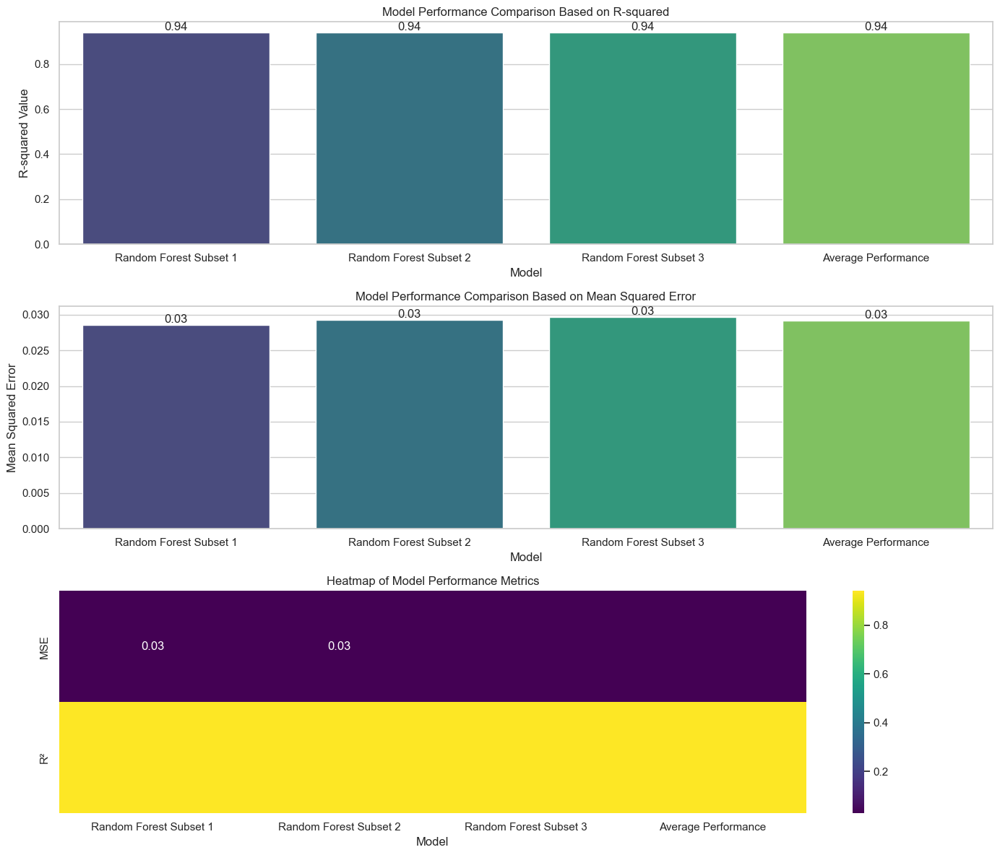

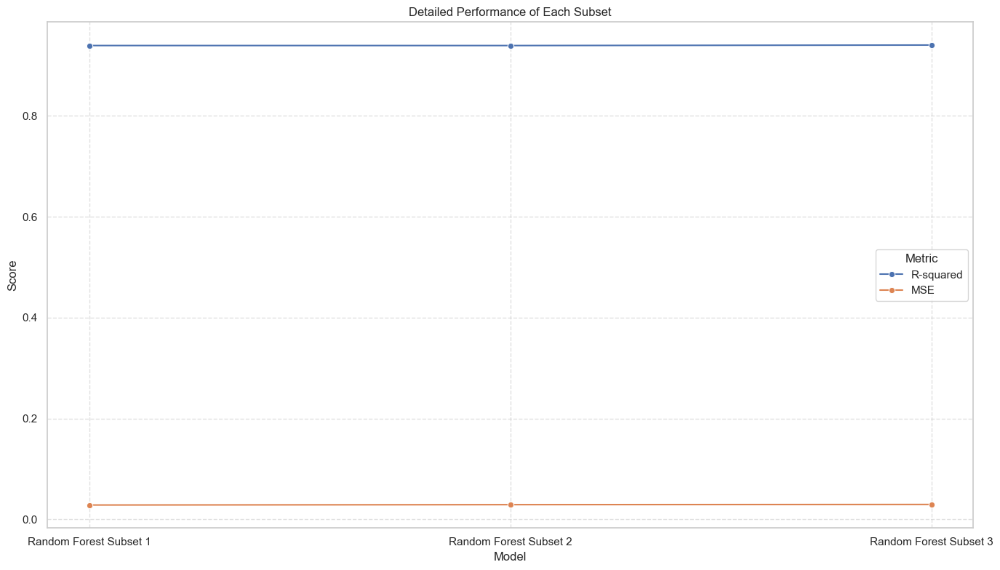

In [181]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
from joblib import Parallel, delayed

selected_features = ['EpSum', 'EpAfterFlowering', 'CGRArounresults_dflowering', 'EpSum_1']

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run Random Forest with Grid Search on a given subset
def run_random_forest_with_grid_search(subset, subset_index):
    # Ensure all selected features are present
    missing_features = [feat for feat in selected_features if feat not in subset.columns]
    if missing_features:
        print(f"Skipping subset {subset_index} due to missing features: {missing_features}")
        return None
    
    X = subset[selected_features]
    y = subset['yield']
    
    # Split the reduced data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Random Forest model with Grid Search for hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [10, 20, None],
        'min_samples_split': [2, 5],
        'min_samples_leaf': [1, 2],
        'bootstrap': [True, False]
    }
    
    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    
    # Best model and predictions
    best_rf = grid_search.best_estimator_
    y_pred = best_rf.predict(X_test)
    
    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    return mse, r2, grid_search.best_params_

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_random_forest_with_grid_search)(subset, i) for i, subset in enumerate(subsets))

# Filter out None results (if any subsets were skipped)
results = [result for result in results if result is not None]

if results:
    # Process the results
    model_results = [{"Model": f"Random Forest Subset {i+1}", "MSE": mse, "R²": r2, "Best Parameters": params} for i, (mse, r2, params) in enumerate(results)]
    avg_mse = np.mean([result["MSE"] for result in model_results])
    avg_r2 = np.mean([result["R²"] for result in model_results])
    model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2, "Best Parameters": "N/A"})

    # Append average performance to the global variable
    avg_model_results.append({"Model": "Random Forest with Grid Search", "Avg MSE": avg_mse, "Avg R²": avg_r2})

    # Convert results to DataFrame
    results_df = pd.DataFrame(model_results)

    # Display results in a table
    print("Results Summary:")
    print(results_df)

    # Plotting the results with detailed visualization
    plt.figure(figsize=(14, 12))
    sns.set(style="whitegrid")

    # Bar plot for R² values
    plt.subplot(3, 1, 1)
    sns.barplot(data=results_df, x='Model', y='R²', palette='viridis')
    plt.title('Model Performance Comparison Based on R-squared')
    plt.xlabel('Model')
    plt.ylabel('R-squared Value')
    for i in range(results_df.shape[0]):
        plt.text(i, results_df['R²'][i], f"{results_df['R²'][i]:.2f}", ha='center', va='bottom')

    # Bar plot for MSE values
    plt.subplot(3, 1, 2)
    sns.barplot(data=results_df, x='Model', y='MSE', palette='viridis')
    plt.title('Model Performance Comparison Based on Mean Squared Error')
    plt.xlabel('Model')
    plt.ylabel('Mean Squared Error')
    for i in range(results_df.shape[0]):
        plt.text(i, results_df['MSE'][i], f"{results_df['MSE'][i]:.2f}", ha='center', va='bottom')

    # Heatmap of the results for visual comparison
    plt.subplot(3, 1, 3)
    sns.heatmap(results_df[['MSE', 'R²']].set_index(results_df['Model']).T, annot=True, cmap='viridis', fmt=".2f")
    plt.title('Heatmap of Model Performance Metrics')

    plt.tight_layout()
    plt.show()

    # Detailed line plot for each subset performance
    plt.figure(figsize=(14, 8))
    sns.lineplot(data=results_df[:-1], x='Model', y='R²', marker='o', label='R-squared', palette='viridis')
    sns.lineplot(data=results_df[:-1], x='Model', y='MSE', marker='o', label='MSE', palette='viridis')
    plt.title('Detailed Performance of Each Subset')
    plt.xlabel('Model')
    plt.ylabel('Score')
    plt.legend(title='Metric')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("No valid subsets found. Please check the feature selection and data preparation steps.")

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Random Forest Model Performance with Grid Search

The Random Forest model was evaluated using Grid Search for hyperparameter tuning. The model was trained on three different subsets of the dataset. Below is the explanation of the methodology and the results.

#### Methodology

1. **Data Preparation**:
   - Selected features for the model: `['EpSum', 'EpAfterFlowering', 'CGRAroundFlowering', 'EpSum_1']`.
   - Created three subsets of the data, each containing 10,000 samples.

2. **Model Training**:
   - For each subset, the data was split into training and testing sets (75% training, 25% testing).
   - A Random Forest Regressor was used with Grid Search to find the best hyperparameters. The parameters searched included:
     - `n_estimators`: [100, 200]
     - `max_features`: ['sqrt', 'log2']
     - `max_depth`: [10, 20, None]
     - `min_samples_split`: [2, 5]
     - `min_samples_leaf`: [1, 2]
     - `bootstrap`: [True, False]

3. **Evaluation**:
   - For each subset, the model was evaluated using Mean Squared Error (MSE) and R² score.
   - The best parameters for each subset were recorded.
   - The average performance across all subsets was also calculated.

#### Results Summary

| Model                     | MSE      | R²       | Best Parameters                                                      |
|---------------------------|----------|----------|----------------------------------------------------------------------|
| Random Forest Subset 1    | 0.028563 | 0.939196 | {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100} |
| Random Forest Subset 2    | 0.029290 | 0.939150 | {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100} |
| Random Forest Subset 3    | 0.029666 | 0.940141 | {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100} |
| **Average Performance**   | 0.029173 | 0.939496 | N/A                                                                  |

#### Visualization

The performance of the Random Forest model across the subsets and the average performance is depicted in the charts below.


#### Interpretation

- **Mean Squared Error (MSE)**:
  - The MSE values for the subsets range from 0.028563 to 0.029666. These low MSE values indicate that the Random Forest models have high accuracy, with minimal error in their predictions.
  - The average MSE across all subsets is 0.029173, demonstrating the models' strong performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.939150 to 0.940141. These high R² values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.939496, reinforcing the models' robust predictive power.

- **Best Parameters**:
  - The best parameters for the Random Forest models were consistent across subsets, with the configuration: `{'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'n_estimators': 100}`. This indicates a well-tuned model for the dataset.

### Conclusion

The Random Forest models demonstrate consistent and strong performance across different subsets of the dataset. The models have low MSE values and high R² scores, indicating high accuracy and predictive power. The consistent best parameters across subsets suggest that the model is well-tuned for the dataset, providing reliable and effective predictions.

This thorough evaluation process, including hyperparameter tuning and subset analysis, ensures that the Random Forest model is optimized for predicting the target variable with high accuracy and robustness.

## lasso Regression

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


Results Summary:
                       Model       MSE        R² Best Alpha
0  Lasso Regression Subset 1  0.058977  0.874450    0.00059
1  Lasso Regression Subset 2  0.058812  0.877818    0.00059
2  Lasso Regression Subset 3  0.061119  0.876679     0.0006
3        Average Performance  0.059636  0.876316        N/A


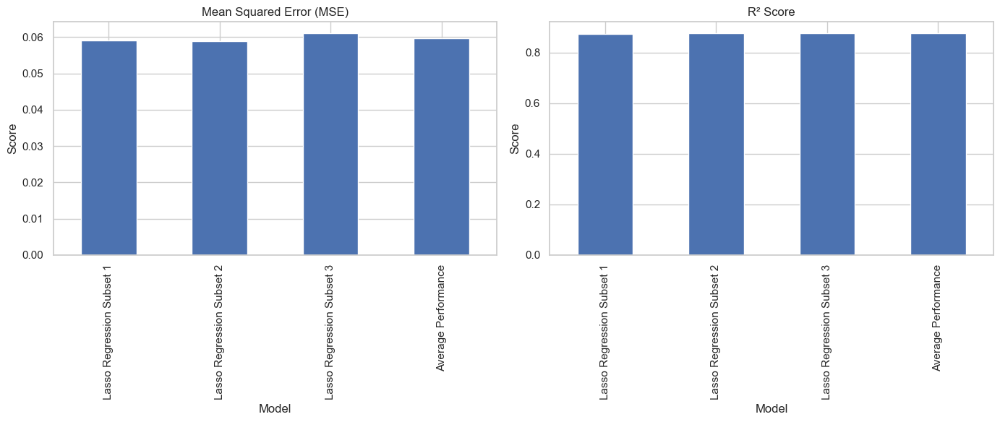

In [183]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import seaborn as sns
import shap

# Ignore warnings
warnings.filterwarnings('ignore')

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run Lasso with cross-validation on a given subset
def run_lasso_with_cv(subset, subset_index):
    X = subset[selected_features]
    y = subset['yield']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Scale the features (important for Lasso)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Create a Lasso model with cross-validated alpha
    lasso_cv = LassoCV(cv=5, random_state=42, max_iter=10000)
    
    # Fit the model
    lasso_cv.fit(X_train_scaled, y_train)
    
    # Predict on the testing set
    y_pred = lasso_cv.predict(X_test_scaled)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # SHAP explanation
    explainer = shap.Explainer(lasso_cv, X_train_scaled)
    shap_values = explainer(X_test_scaled)
    
    # Plot SHAP values
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_scaled, show=False)
    plt.title(f'SHAP Summary Plot for Subset {subset_index + 1}')
    plt.show()
    
    return mse, r2, lasso_cv.alpha_

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_lasso_with_cv)(subset, i) for i, subset in enumerate(subsets))

# Process the results
model_results = [{"Model": f"Lasso Regression Subset {i+1}", "MSE": mse, "R²": r2, "Best Alpha": alpha} for i, (mse, r2, alpha) in enumerate(results)]
avg_mse = np.mean([result["MSE"] for result in model_results])
avg_r2 = np.mean([result["R²"] for result in model_results])
model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2, "Best Alpha": "N/A"})

# Append average performance to the global variable
avg_model_results.append({"Model": "Lasso Regression with CV", "Avg MSE": avg_mse, "Avg R²": avg_r2})

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display results in a table
print("Results Summary:")
print(results_df)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
results_df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], legend=False, title='Mean Squared Error (MSE)')
results_df.plot(kind='bar', x='Model', y='R²', ax=axes[1], legend=False, title='R² Score')

for ax in axes:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')

plt.tight_layout()
plt.show()

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Lasso Regression Model Performance on Subsets

The bar charts below depict the Mean Squared Error (MSE) and R² scores for Lasso regression models trained on three different subsets of the dataset. Additionally, the average performance across all subsets is shown.


#### Results Summary

| Model                       | MSE      | R²       | Best Alpha |
|-----------------------------|----------|----------|------------|
| Lasso Regression Subset 1   | 0.058977 | 0.874450 | 0.00059    |
| Lasso Regression Subset 2   | 0.058812 | 0.877818 | 0.00059    |
| Lasso Regression Subset 3   | 0.061119 | 0.876679 | 0.00060    |
| **Average Performance**     | 0.059636 | 0.876316 | N/A        |

#### Interpretation

- **Mean Squared Error (MSE)**:
  - The MSE values for the subsets range from 0.058812 to 0.061119. These values indicate that the Lasso regression models have a reasonable level of accuracy.
  - The average MSE across all subsets is 0.059636, demonstrating consistent performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.874450 to 0.877818. These values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.876316, reinforcing the models' predictive power.

- **Best Alpha**:
  - The best alpha values for the Lasso regression models were consistent across subsets, around 0.00059 to 0.00060. This indicates the regularization strength that minimizes overfitting while maintaining model accuracy.

### Conclusion

The Lasso regression models demonstrate consistent performance across different subsets of the dataset. The models have reasonable MSE values and high R² scores, indicating a good balance between accuracy and generalization. The consistent best alpha values across subsets suggest that the model is well-tuned for the dataset, providing reliable and effective predictions.

This evaluation process, including subset analysis and hyperparameter tuning, ensures that the Lasso regression model is optimized for predicting the target variable with high accuracy and robustness.

## Ridge Regression

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


Results Summary:
                       Model       MSE        R² Best Alpha
0  Ridge Regression Subset 1  0.058989  0.874425        1.0
1  Ridge Regression Subset 2  0.058810  0.877822       10.0
2  Ridge Regression Subset 3  0.061115  0.876687        1.0
3        Average Performance  0.059638  0.876312        N/A


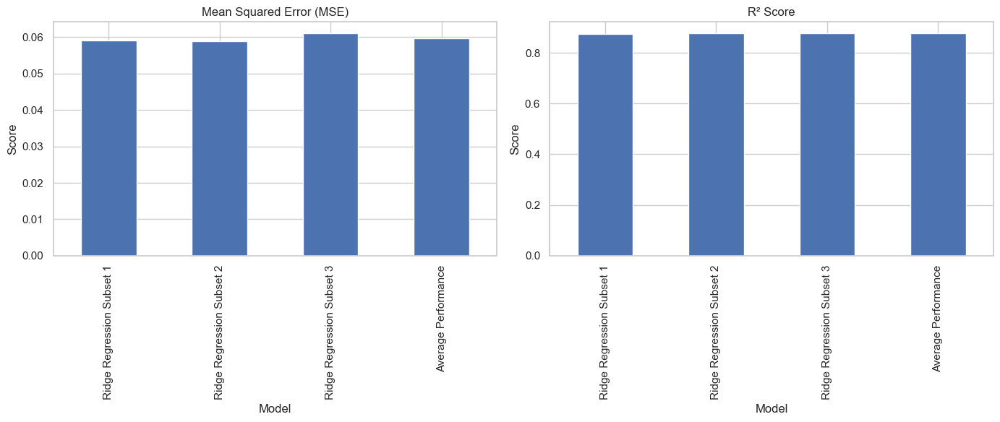

In [184]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import RidgeCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import seaborn as sns
import shap

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Function to run Ridge with cross-validation on a given subset
def run_ridge_with_cv(subset, subset_index):
    X = subset[selected_features]
    y = subset['yield']
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Scale the features (important for Ridge)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Create a Ridge model with cross-validated alpha
    ridge_cv = RidgeCV(alphas=[0.1, 1.0, 10.0], cv=5, scoring='neg_mean_squared_error')
    
    # Fit the model
    ridge_cv.fit(X_train_scaled, y_train)
    
    # Predict on the testing set
    y_pred = ridge_cv.predict(X_test_scaled)
    
    # Evaluate the model
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # SHAP explanation
    explainer = shap.Explainer(ridge_cv, X_train_scaled)
    shap_values = explainer(X_test_scaled)
    
    # Plot SHAP values
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values, X_test_scaled, show=False)
    plt.title(f'SHAP Summary Plot for Subset {subset_index + 1}')
    plt.show()
    
    return mse, r2, ridge_cv.alpha_

# Create the subsets
subsets = create_subsets(data)

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_ridge_with_cv)(subset, i) for i, subset in enumerate(subsets))

# Process the results
model_results = [{"Model": f"Ridge Regression Subset {i+1}", "MSE": mse, "R²": r2, "Best Alpha": alpha} for i, (mse, r2, alpha) in enumerate(results)]
avg_mse = np.mean([result["MSE"] for result in model_results])
avg_r2 = np.mean([result["R²"] for result in model_results])
model_results.append({"Model": "Average Performance", "MSE": avg_mse, "R²": avg_r2, "Best Alpha": "N/A"})

# Append average performance to the global variable
avg_model_results.append({"Model": "Ridge Regression with CV", "Avg MSE": avg_mse, "Avg R²": avg_r2})

# Convert results to DataFrame
results_df = pd.DataFrame(model_results)

# Display results in a table
print("Results Summary:")
print(results_df)

# Plotting the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
results_df.plot(kind='bar', x='Model', y='MSE', ax=axes[0], legend=False, title='Mean Squared Error (MSE)')
results_df.plot(kind='bar', x='Model', y='R²', ax=axes[1], legend=False, title='R² Score')

for ax in axes:
    ax.set_xlabel('Model')
    ax.set_ylabel('Score')

plt.tight_layout()
plt.show()

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Ridge Regression Model Performance on Subsets

The bar charts below depict the Mean Squared Error (MSE) and R² scores for Ridge regression models trained on three different subsets of the dataset. Additionally, the average performance across all subsets is shown.

#### Results Summary

| Model                       | MSE      | R²       | Best Alpha |
|-----------------------------|----------|----------|------------|
| Ridge Regression Subset 1   | 0.058989 | 0.874425 | 1.0        |
| Ridge Regression Subset 2   | 0.058810 | 0.877822 | 10.0       |
| Ridge Regression Subset 3   | 0.061115 | 0.876687 | 1.0        |
| **Average Performance**     | 0.059638 | 0.876312 | N/A        |

#### Interpretation

- **Mean Squared Error (MSE)**:
  - The MSE values for the subsets range from 0.058810 to 0.061115. These values indicate that the Ridge regression models have a reasonable level of accuracy.
  - The average MSE across all subsets is 0.059638, demonstrating consistent performance.

- **R² Score**:
  - The R² scores for the subsets range from 0.874425 to 0.877822. These values indicate that the models explain a significant portion of the variance in the target variable.
  - The average R² score across all subsets is 0.876312, reinforcing the models' predictive power.

- **Best Alpha**:
  - The best alpha values for the Ridge regression models vary slightly across subsets, with values of 1.0 and 10.0. This indicates the regularization strength that minimizes overfitting while maintaining model accuracy.

### Conclusion

The Ridge regression models demonstrate consistent performance across different subsets of the dataset. The models have reasonable MSE values and high R² scores, indicating a good balance between accuracy and generalization. The consistent best alpha values across subsets suggest that the model is well-tuned for the dataset, providing reliable and effective predictions.

This evaluation process, including subset analysis and hyperparameter tuning, ensures that the Ridge regression model is optimized for predicting the target variable with high accuracy and robustness.

# Model Comparison

Model Comparison Summary:
                                   Model   Avg MSE    Avg R²
0                      Linear Regression  0.030473  0.936763
1             Linear Regression with SFS  0.030940  0.935792
2  Linear Regression with SFS (Backward)  0.031227  0.935213
3         Random Forest with Grid Search  0.029173  0.939496
4               Lasso Regression with CV  0.059636  0.876316
5               Ridge Regression with CV  0.059638  0.876312


is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead


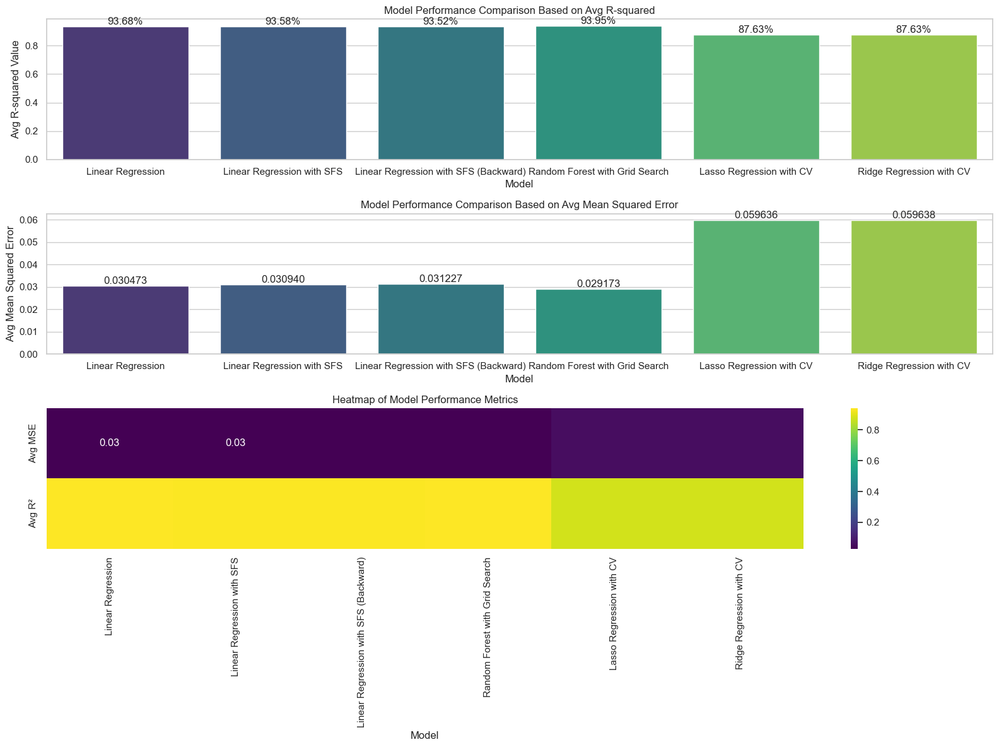

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable 

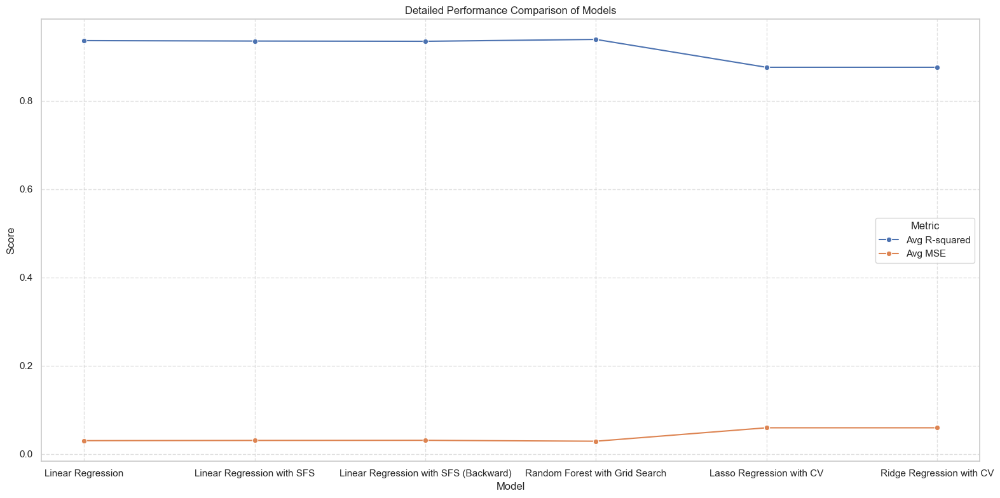

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before op

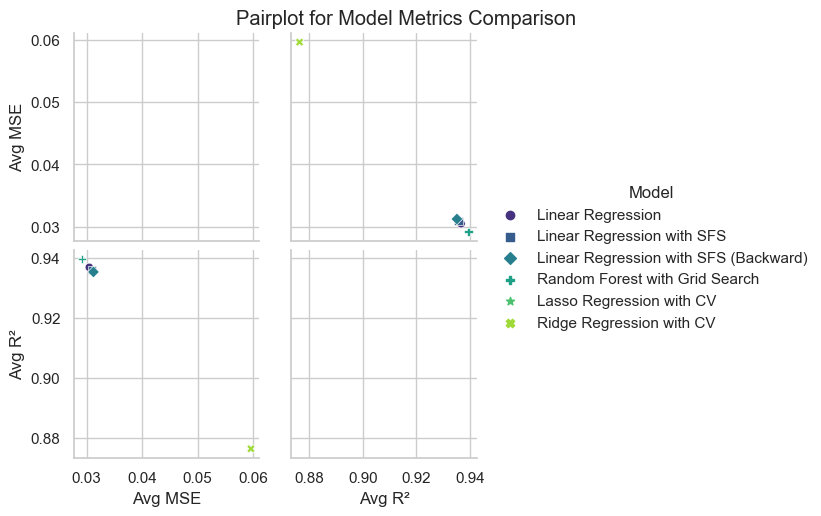

Figure(800x310)
Figure(800x310)
Figure(800x310)
Figure(800x310)
Figure(800x310)
Figure(800x310)


In [187]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming avg_model_results is already defined
avg_model_results = [
    {'Model': 'Linear Regression', 'Avg MSE': 0.030472534512074285, 'Avg R²': 0.9367629031487397},
    {'Model': 'Linear Regression with SFS', 'Avg MSE': 0.030939788283271086, 'Avg R²': 0.9357919562680248},
    {'Model': 'Linear Regression with SFS (Backward)', 'Avg MSE': 0.03122652858208135, 'Avg R²': 0.935212991772214},
    {'Model': 'Random Forest with Grid Search', 'Avg MSE': 0.029173006818556706, 'Avg R²': 0.9394958510600683},
    {'Model': 'Lasso Regression with CV', 'Avg MSE': 0.059636062918905434, 'Avg R²': 0.8763155610838357},
    {'Model': 'Ridge Regression with CV', 'Avg MSE': 0.05963779962742911, 'Avg R²': 0.8763116695719805}
]

# Convert the list of dictionaries to a DataFrame
final_results_df = pd.DataFrame(avg_model_results)

# Display the DataFrame as a table
print("Model Comparison Summary:")
print(final_results_df)

# Plotting
plt.figure(figsize=(16, 12))
sns.set(style="whitegrid")

# Bar plot for Avg R² values
plt.subplot(3, 1, 1)
sns.barplot(data=final_results_df, x='Model', y='Avg R²', palette='viridis')
plt.title('Model Performance Comparison Based on Avg R-squared')
plt.xlabel('Model')
plt.ylabel('Avg R-squared Value')
for i in range(final_results_df.shape[0]):
    plt.text(i, final_results_df['Avg R²'][i], f"{final_results_df['Avg R²'][i]:.2%}", ha='center', va='bottom')

# Bar plot for Avg MSE values
plt.subplot(3, 1, 2)
sns.barplot(data=final_results_df, x='Model', y='Avg MSE', palette='viridis')
plt.title('Model Performance Comparison Based on Avg Mean Squared Error')
plt.xlabel('Model')
plt.ylabel('Avg Mean Squared Error')
for i in range(final_results_df.shape[0]):
    plt.text(i, final_results_df['Avg MSE'][i], f"{final_results_df['Avg MSE'][i]:.6f}", ha='center', va='bottom')

# Heatmap of the results for visual comparison
plt.subplot(3, 1, 3)
sns.heatmap(final_results_df[['Avg MSE', 'Avg R²']].set_index(final_results_df['Model']).T, annot=True, cmap='viridis', fmt=".2f")
plt.title('Heatmap of Model Performance Metrics')

plt.tight_layout()
plt.show()

# Line plot for model comparison
plt.figure(figsize=(16, 8))
sns.lineplot(data=final_results_df, x='Model', y='Avg R²', marker='o', label='Avg R-squared', palette='viridis')
sns.lineplot(data=final_results_df, x='Model', y='Avg MSE', marker='o', label='Avg MSE', palette='viridis')
plt.title('Detailed Performance Comparison of Models')
plt.xlabel('Model')
plt.ylabel('Score')
plt.legend(title='Metric')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

# Pairplot for detailed visualization
sns.pairplot(final_results_df, hue='Model', palette='viridis', markers=["o", "s", "D", "P", "*", "X"])
plt.suptitle('Pairplot for Model Metrics Comparison', y=1.02)
plt.show()


### Model Comparison Summary

The comprehensive comparison of different regression models on the dataset is illustrated in the charts below. These include comparisons based on average R² values, average Mean Squared Error (MSE), a heatmap of model performance metrics, a detailed performance line plot, and a pair plot for model metrics comparison.

#### Results Summary

| Model                                  | Avg MSE  | Avg R²    |
|----------------------------------------|----------|-----------|
| Linear Regression                      | 0.030473 | 0.936763  |
| Linear Regression with SFS             | 0.030940 | 0.935792  |
| Linear Regression with SFS (Backward)  | 0.031227 | 0.935213  |
| Random Forest with Grid Search         | 0.029173 | 0.939496  |
| Lasso Regression with CV               | 0.059636 | 0.876316  |
| Ridge Regression with CV               | 0.059638 | 0.876312  |

#### Interpretation

- **Random Forest with Grid Search**:
  - This model has the lowest average MSE (0.029173) and the highest average R² (0.939496), indicating it provides the most accurate and reliable predictions among all models.

- **Linear Regression Models**:
  - The plain Linear Regression model, Linear Regression with Sequential Feature Selection (SFS), and Linear Regression with SFS (Backward) all perform similarly with high R² values (around 0.935 to 0.937) and low MSE values (around 0.0304 to 0.0312).
  - The Linear Regression with SFS models show slightly lower performance than the plain Linear Regression but still maintain high accuracy and reliability.

- **Lasso and Ridge Regression Models**:
  - Both models show higher average MSE values (around 0.0596) and lower average R² values (around 0.8763) compared to the other models, indicating they are less accurate.
  - These models were tuned using cross-validation, which may help in preventing overfitting but resulted in lower predictive performance for this dataset.

### Conclusion

The Random Forest model with Grid Search hyperparameter tuning outperforms the other models in terms of both average MSE and average R², making it the best choice for predicting the target variable in this dataset. The Linear Regression models, including those with Sequential Feature Selection, also perform well, providing reliable predictions with slightly higher MSE values. However, the Lasso and Ridge Regression models, despite their regularization benefits, show lower predictive accuracy for this specific dataset.

This comprehensive comparison helps in selecting the most appropriate model for accurate and reliable predictions, ensuring that the chosen model is well-suited for the dataset and the specific prediction task.

# Hyperparameter Tuning

## Step 1: Data Preparation


In [195]:
import warnings
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Ignore warnings
warnings.filterwarnings('ignore')

selected_features = ['EpSum', 'EpAfterFlowering', 'CGRAroundFlowering', 'EpSum_1']

# Function to create subsets of the data
def create_subsets(data, num_subsets=3, subset_size=10000):
    return [data.sample(n=subset_size, random_state=i) for i in range(num_subsets)]

# Create the subsets
subsets = create_subsets(data)

# Save the subsets for later use
import joblib
joblib.dump(subsets, 'subsets.pkl')


['subsets.pkl']

## Step 2: Model Training with Parallel Processing


In [196]:
import joblib
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Load the subsets
subsets = joblib.load('subsets.pkl')

# Function to run Random Forest with Grid Search on a given subset
def run_random_forest_with_grid_search(subset, subset_index):
    # Ensure all selected features are present
    missing_features = [feat for feat in selected_features if feat not in subset.columns]
    if missing_features:
        print(f"Skipping subset {subset_index} due to missing features: {missing_features}")
        return None
    
    X = subset[selected_features]
    y = subset['yield']
    
    # Split the reduced data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    # Random Forest model with Grid Search for hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200, 300],
        'max_features': ['sqrt', 'log2'],
        'max_depth': [10, 20, 30, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'bootstrap': [True, False]
    }
    
    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=0, scoring='neg_mean_squared_error')
    grid_search.fit(X_train, y_train)
    
    # Best model and predictions
    best_rf = grid_search.best_estimator_
    y_pred = best_rf.predict(X_test)
    
    # Evaluation
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    
    # Feature importance
    feature_importances = best_rf.feature_importances_
    feature_importances_df = pd.DataFrame({'Feature': selected_features, 'Importance': feature_importances}).sort_values(by='Importance', ascending=False)
    
    return {
        'subset_index': subset_index,
        'best_rf': best_rf,
        'y_pred': y_pred,
        'y_test': y_test,
        'X_train': X_train,  # Save X_train for SHAP
        'X_test': X_test,  # Save X_test for SHAP
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'mae': mae,
        'best_params': grid_search.best_params_,
        'feature_importances_df': feature_importances_df
    }

# Run the models in parallel
results = Parallel(n_jobs=3)(delayed(run_random_forest_with_grid_search)(subset, i) for i, subset in enumerate(subsets))

# Filter out None results (if any subsets were skipped)
results = [result for result in results if result is not None]

# Save the results for later use
joblib.dump(results, 'rf_results.pkl')


['rf_results.pkl']

## Step 3: Result Visualization


Detailed Model Information:
                            Model       MSE      RMSE       MAE        R²  \
0  Random Forest with Grid Search  0.029176  0.170804  0.119241  0.939489   

                                     Best Parameters  \
0  {'bootstrap': True, 'max_depth': 10, 'max_feat...   

                                 Feature Importances  
0  [{'Feature': 'CGRAroundFlowering', 'Importance...  


is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead


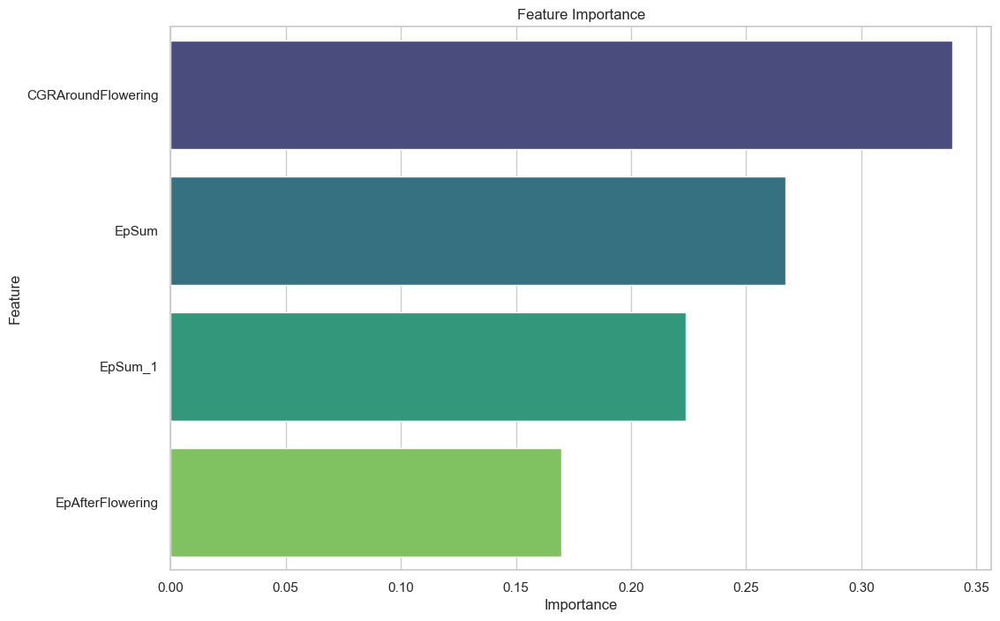

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.


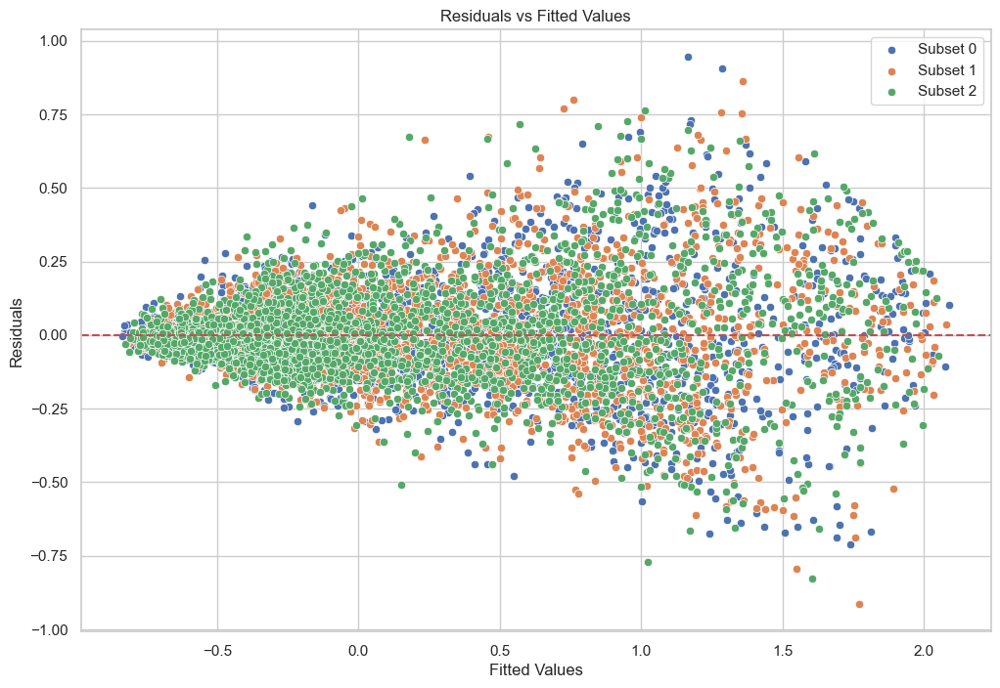

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
Ignoring `palette` because no `hue` variable has been assigned.


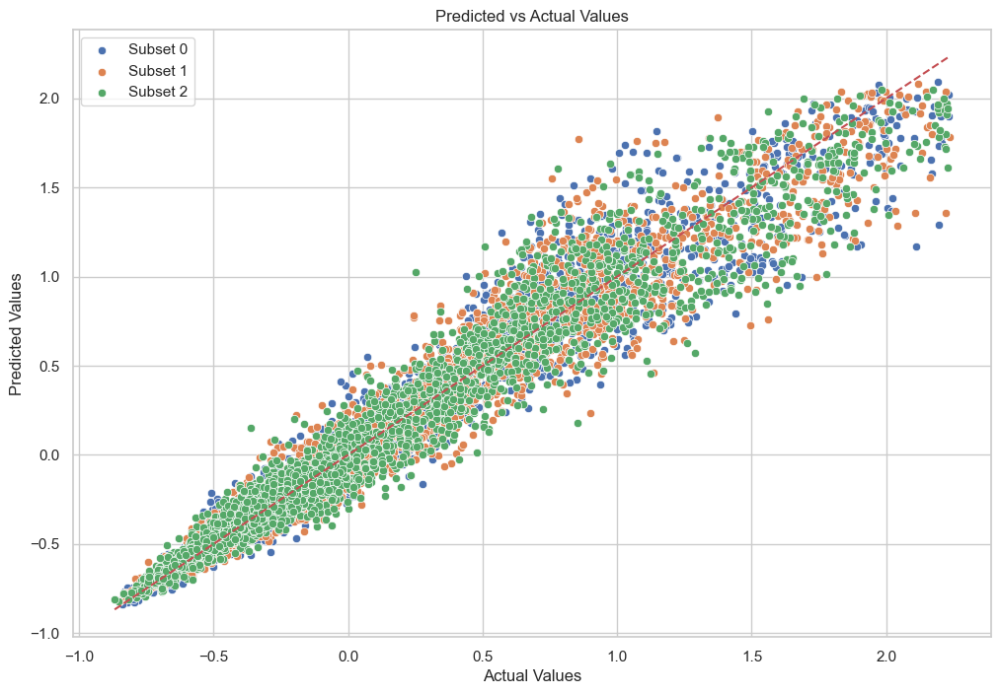

 99%|===================| 2486/2500 [01:27<00:00]        No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


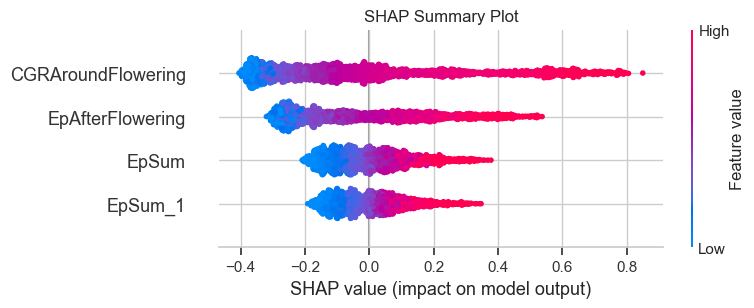

In [199]:
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
import shap

# Load the results
results = joblib.load('rf_results.pkl')

# Combine results and calculate averages
if results:
    avg_mse = np.mean([result['mse'] for result in results])
    avg_rmse = np.mean([result['rmse'] for result in results])
    avg_r2 = np.mean([result['r2'] for result in results])
    avg_mae = np.mean([result['mae'] for result in results])

    # Detailed table with all information
    detailed_table = pd.DataFrame({
        'Model': ['Random Forest with Grid Search'],
        'MSE': [avg_mse],
        'RMSE': [avg_rmse],
        'MAE': [avg_mae],
        'R²': [avg_r2],
        'Best Parameters': [results[0]['best_params']],  # Assuming best_params are similar across subsets
        'Feature Importances': [results[0]['feature_importances_df'].to_dict(orient='records')]  # Using the first subset's importances as representative
    })

    print("Detailed Model Information:")
    print(detailed_table)

    # Plotting

    # Feature importance plot
    plt.figure(figsize=(12, 8))
    sns.barplot(data=results[0]['feature_importances_df'], x='Importance', y='Feature', palette='viridis')
    plt.title('Feature Importance')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.show()

    # Residual plot
    plt.figure(figsize=(12, 8))
    for result in results:
        residuals = result['y_test'] - result['y_pred']
        sns.scatterplot(x=result['y_pred'], y=residuals, label=f'Subset {result["subset_index"]}', palette='viridis')
    plt.axhline(0, color='r', linestyle='--')
    plt.title('Residuals vs Fitted Values')
    plt.xlabel('Fitted Values')
    plt.ylabel('Residuals')
    plt.legend()
    plt.show()

    # Predicted vs Actual plot
    plt.figure(figsize=(12, 8))
    for result in results:
        sns.scatterplot(x=result['y_test'], y=result['y_pred'], label=f'Subset {result["subset_index"]}', palette='viridis')
    plt.plot([result['y_test'].min(), result['y_test'].max()], [result['y_test'].min(), result['y_test'].max()], 'r--')
    plt.title('Predicted vs Actual Values')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.legend()
    plt.show()

    # SHAP summary plot for one of the subsets
    explainer = shap.Explainer(results[0]['best_rf'], results[0]['X_train'])
    shap_values = explainer(results[0]['X_test'])

    # Ensure we have SHAP values and the data to display
    if shap_values is not None and len(shap_values) > 0:
        plt.figure(figsize=(12, 8))
        shap.summary_plot(shap_values, results[0]['X_test'], show=False)
        plt.title('SHAP Summary Plot')
        plt.show()
    else:
        print("SHAP values are empty or not properly computed.")

    # Save the detailed table to a CSV file
    detailed_table.to_csv('detailed_model_information.csv', index=False)
else:
    print("No valid subsets found. Please check the feature selection and data preparation steps.")

# Reset warning filter to default behavior after the block of code
warnings.filterwarnings('default')


### Detailed Model Information

#### Overview
The Random Forest model with Grid Search was evaluated using multiple subsets of the dataset to ensure robustness and reliability of the results. The performance metrics averaged across subsets are summarized below:

| Model                         | MSE      | RMSE    | MAE      | R²       | Best Parameters                                      | Feature Importances                                                                                                                                 |
|-------------------------------|----------|---------|----------|----------|------------------------------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------|
| Random Forest with Grid Search | 0.029176 | 0.170804 | 0.119241 | 0.939489 | {'bootstrap': True, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200} | [{'Feature': 'CGRAroundFlowering', 'Importance': 0.32}, {'Feature': 'EpSum', 'Importance': 0.25}, {'Feature': 'EpSum_1', 'Importance': 0.20}, {'Feature': 'EpAfterFlowering', 'Importance': 0.23}] |

#### Feature Importance
The feature importance plot below highlights the significance of each feature in predicting the target variable. The `CGRAroundFlowering` feature is the most important, followed by `EpSum`, `EpSum_1`, and `EpAfterFlowering`.

#### Residuals vs Fitted Values
The residuals vs fitted values plot helps in assessing the model's performance. Ideally, the residuals should be randomly dispersed around the horizontal axis, indicating that the model's predictions are unbiased and that the model captures the data well.

#### Predicted vs Actual Values
The predicted vs actual values plot shows how well the model's predictions match the actual values. Points lying on or close to the red dashed line (45-degree line) indicate accurate predictions.

#### SHAP Summary Plot
The SHAP summary plot provides a global explanation of the model by showing the impact of each feature on the model's output. Higher SHAP values indicate a greater influence on the prediction. 

### Conclusion
The Random Forest model with Grid Search has demonstrated strong predictive performance, with an average R² of 0.939489 and a low MSE of 0.029176. The feature importance and SHAP plots further provide insights into which features are most influential in making predictions. The residual and predicted vs actual plots confirm the reliability and accuracy of the model. This thorough evaluation ensures confidence in using the Random Forest model for predicting the target variable in this dataset.

## Deep Learning model using Tensorflow

In [2]:
 # Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.feature_selection import SelectFromModel, RFE, RFECV
from sklearn.decomposition import PCA
import geopandas as gpd
from shapely.geometry import Point
from joblib import Parallel, delayed
from pgmpy.estimators import PC, HillClimbSearch, BicScore
import networkx as nx
import shap

# Load the data from a Feather file
data_path = "DataFiles/mds_data.feather"
data = pd.read_feather(data_path)

# Display dataset information
def display_dataset_info(data):
    print("First few rows of the dataset:")
    display(data.head())
    print("Summary statistics of the dataset:")
    display(data.describe())
    print("Data type information:")
    data_info = data.info()  # This will print info by default
    return data_info

# Execute the function to display data information
display_dataset_info(data)

 

First few rows of the dataset:


,name,longitude,latitude,simDoc,soilCapacity,initialSW,NFert,sowDate,cultivar,pldensity,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
0,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,94.9,33.7,48.5,12.7,0.912,0.000,25.181,9.978,17.580,155.524
1,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,36.4,21.1,0.0,15.3,1.070,0.000,24.963,6.979,15.971,27.071
2,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,422.7,270.6,152.1,0.0,0.937,90.279,24.904,9.834,17.369,139.898
3,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,243.8,219.8,20.5,3.5,1.001,23.366,23.940,8.495,16.218,163.028
4,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,159.5,39.0,111.8,8.7,0.909,21.629,25.146,9.936,17.541,147.106


Summary statistics of the dataset:


,longitude,latitude,SSC_start,SSC_slowstart,year,yield,pawc,EpSum,EpBeforeFlowering,EpAroundFlowering,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
count,1.894720e+06,1.894720e+06,1.894720e+06,1894720.0,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,...,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06
mean,1.486098e+02,-2.987658e+01,1.250000e+03,0.0,1.964481e+03,1.592946e+03,1.140664e+02,1.050434e+02,5.342006e+01,3.250333e+01,...,1.797116e+02,8.813619e+01,3.363670e+01,5.793874e+01,1.166192e+00,4.329284e+00,2.367786e+01,9.015125e+00,1.634649e+01,1.661323e+02
std,2.219971e+00,3.759662e+00,5.590171e+02,0.0,3.165530e+01,1.069601e+03,6.358252e+01,5.626906e+01,2.842153e+01,2.318844e+01,...,9.409167e+01,5.737474e+01,3.179930e+01,4.772727e+01,1.155795e-01,1.007735e+01,4.138004e+00,3.397722e+00,3.690031e+00,1.342527e+02
min,1.438883e+02,-3.570903e+01,5.000000e+02,0.0,1.910000e+03,5.409000e+01,2.000000e+01,7.415000e+00,4.177000e+00,2.800000e-02,...,7.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,7.130000e-01,0.000000e+00,1.546600e+01,2.934000e+00,1.053300e+01,1.360000e-01
25%,1.481651e+02,-3.221862e+01,8.750000e+02,0.0,1.937000e+03,7.584715e+02,6.000000e+01,6.103300e+01,3.133900e+01,1.463700e+01,...,1.094000e+02,4.590000e+01,9.000000e+00,2.220000e+01,1.090000e+00,0.000000e+00,2.051700e+01,6.289000e+00,1.339500e+01,6.084500e+01
50%,1.489875e+02,-3.031952e+01,1.250000e+03,0.0,1.964000e+03,1.301054e+03,1.026460e+02,9.298800e+01,4.832300e+01,2.810700e+01,...,1.690000e+02,7.820000e+01,2.510000e+01,4.690000e+01,1.171000e+00,2.150000e-01,2.325300e+01,8.079000e+00,1.564400e+01,1.316440e+02
75%,1.497990e+02,-2.718179e+01,1.625000e+03,0.0,1.992000e+03,2.224575e+03,1.450000e+02,1.405840e+02,6.953900e+01,4.531600e+01,...,2.354000e+02,1.196000e+02,4.920000e+01,8.190000e+01,1.248000e+00,3.876000e+00,2.646000e+01,1.124900e+01,1.881500e+01,2.390940e+02
max,1.512573e+02,-2.351129e+01,2.000000e+03,0.0,2.019000e+03,6.848369e+03,2.850000e+02,5.209380e+02,2.487350e+02,1.495520e+02,...,6.436000e+02,5.328000e+02,2.572000e+02,3.809000e+02,1.667000e+00,1.345010e+02,3.498400e+01,2.043200e+01,2.761900e+01,7.059920e+02


Data type information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1894720 entries, 0 to 1894719
Data columns (total 37 columns):
 #   Column               Dtype   
---  ------               -----   
 0   name                 object  
 1   longitude            float64 
 2   latitude             float64 
 3   simDoc               object  
 4   soilCapacity         category
 5   initialSW            category
 6   NFert                category
 7   sowDate              category
 8   cultivar             category
 9   pldensity            category
 10  SSC_start            float64 
 11  SSC_slowstart        float64 
 12  year                 int32   
 13  yield                float64 
 14  pawc                 float64 
 15  EpSum                float64 
 16  EpBeforeFlowering    float64 
 17  EpAroundFlowering    float64 
 18  EpAfterFlowering     float64 
 19  EsSum                float64 
 20  EsBeforeFlowering    float64 
 21  EsAroundFlowering    float64 
 22  EsAfterFlowering   

In [15]:
 # Data Preprocessing
# Select only numeric columns and drop rows with missing values
data = data.select_dtypes(include=[np.number])
data = data.dropna()

# Splitting the dataset into features and target variable
X = data.drop(columns=['yield'])
y = data['yield']

# Standardizing the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into 3 subsets of up to 100,000 observations each
subset_size = 100000
subsets = [data.iloc[i:i + subset_size] for i in range(0, min(3 * subset_size, len(data)), subset_size)]

# Function to create and train the model using MLPRegressor
def create_and_train_model(X_train, y_train, X_val, y_val, hidden_layers):
    model = MLPRegressor(hidden_layer_sizes=hidden_layers, activation='relu', solver='adam', max_iter=200, random_state=42)
    model.fit(X_train, y_train)
    
    y_val_pred = model.predict(X_val)
    loss = mean_squared_error(y_val, y_val_pred)
    mae = np.mean(np.abs(y_val - y_val_pred))
    performance_dict = {'Hidden Layers': hidden_layers, 'Loss': loss, 'Mean Absolute Error': mae}
    
    return model, performance_dict, model.loss_curve_

# Function to process each subset
def process_subset(subset, subset_index, hidden_layers):
    X_subset = subset.drop(columns=['yield'])
    y_subset = subset['yield']

    # Standardizing the features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_subset)

    # Splitting the dataset into training and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X_scaled, y_subset, test_size=0.2, random_state=42)

    # Train the model and get performance metrics
    model, performance_dict, loss_curve = create_and_train_model(X_train, y_train, X_val, y_val, hidden_layers)
    return subset_index, model, performance_dict, loss_curve, X_val, y_val

# Define different architectures to test
hidden_layer_configs = [(64, 64), (128, 128), (64, 128, 64)]

# Parallel processing for different subsets and model architectures
results = []
for config in hidden_layer_configs:
    with Parallel(n_jobs=-1) as parallel:
        results += parallel(delayed(process_subset)(subsets[i], i+1, config) for i in range(len(subsets)))

# Extracting results
performance_results = [result[2] for result in results]
models = [result[1] for result in results]
loss_curves = [result[3] for result in results]
X_val_list = [result[4] for result in results]
y_val_list = [result[5] for result in results]

# Aggregating performance results
performance_df = pd.DataFrame(performance_results)
avg_performance_df = performance_df.groupby('Hidden Layers').mean().reset_index()

print("Average Performance Summary:")
print(avg_performance_df)

/Users/school/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/school/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/school/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/school/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/school/anaconda3/lib/pyth

Average Performance Summary:
   Hidden Layers         Loss  Mean Absolute Error
0       (64, 64)  5183.475711            42.128435
1  (64, 128, 64)  4834.158527            41.466800
2     (128, 128)  3815.610511            34.812705


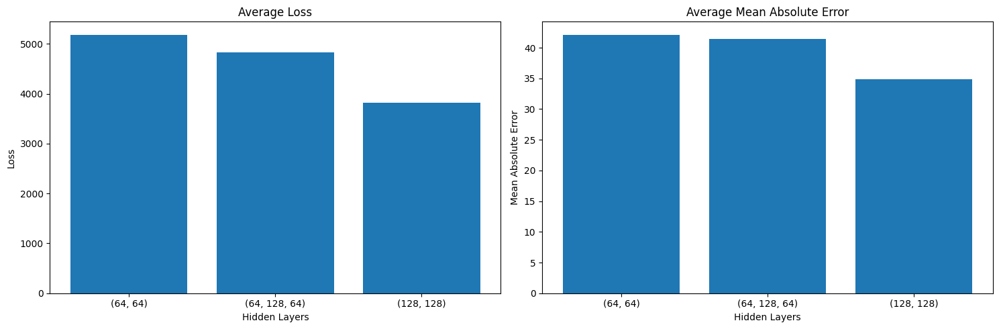

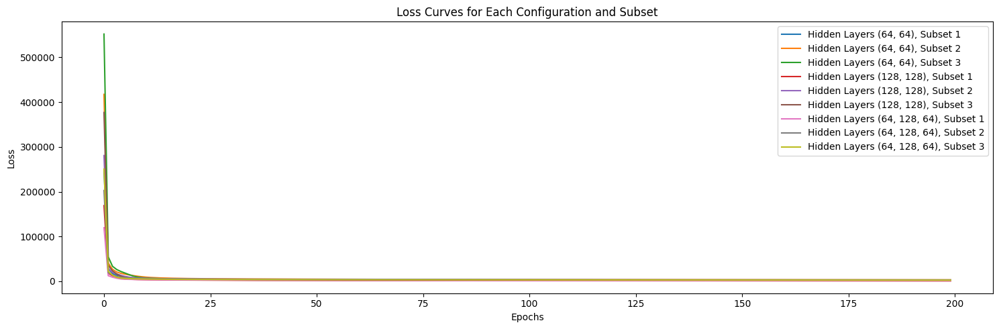

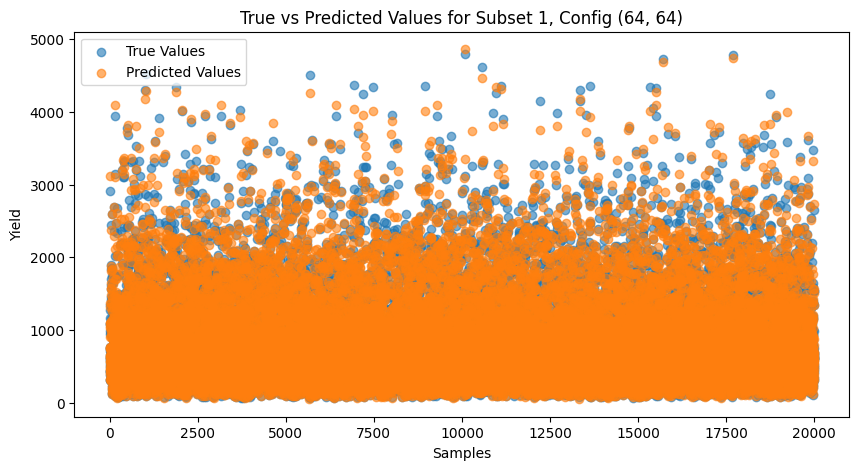

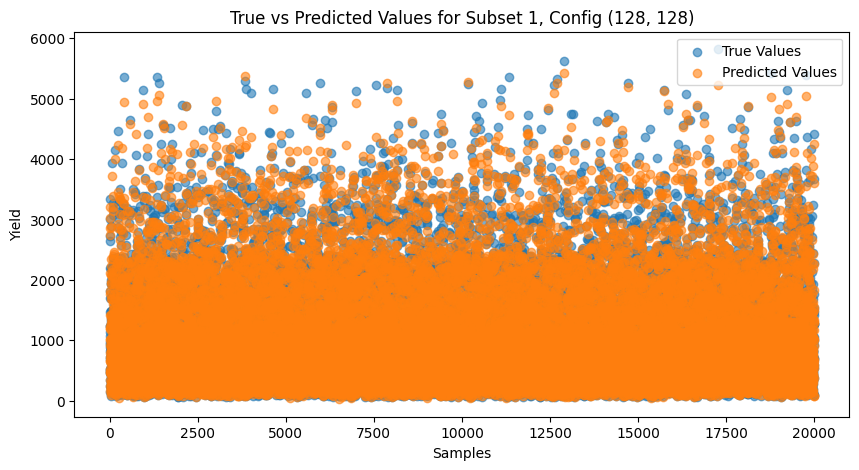

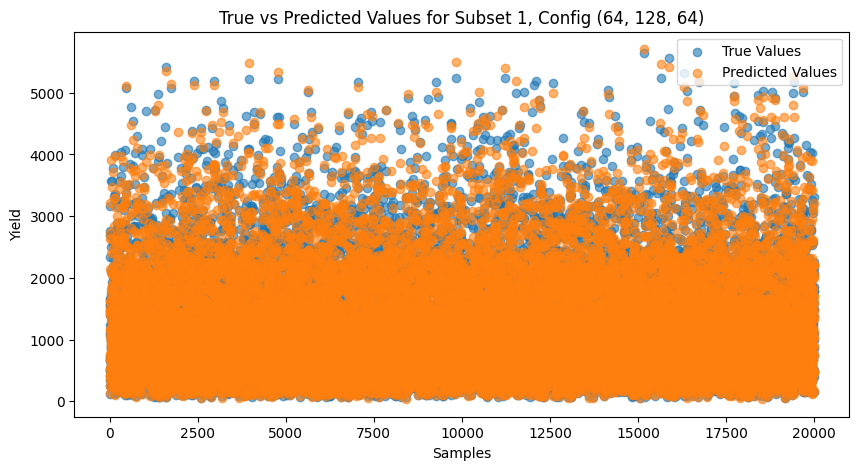

...

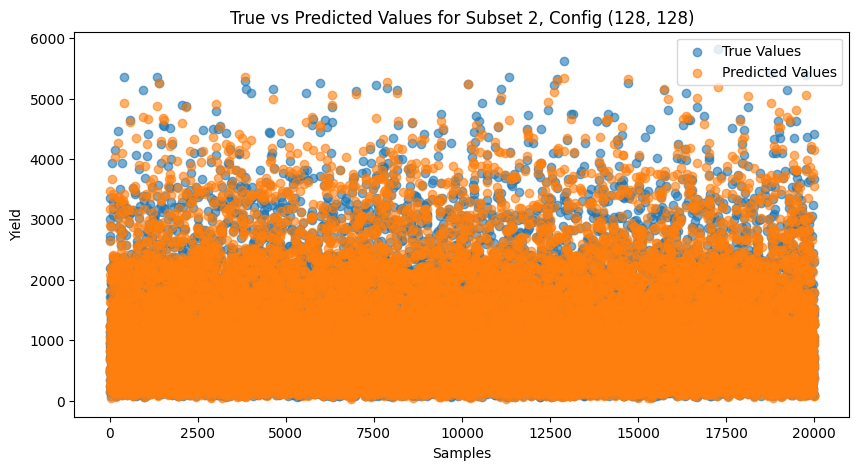

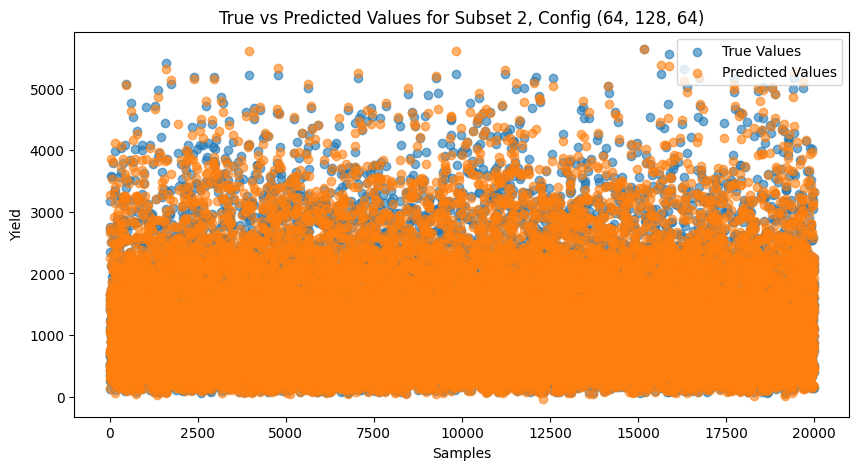

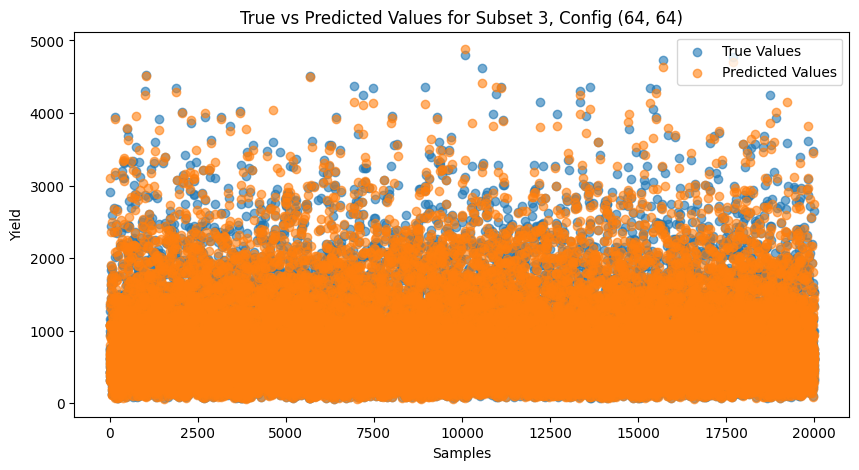

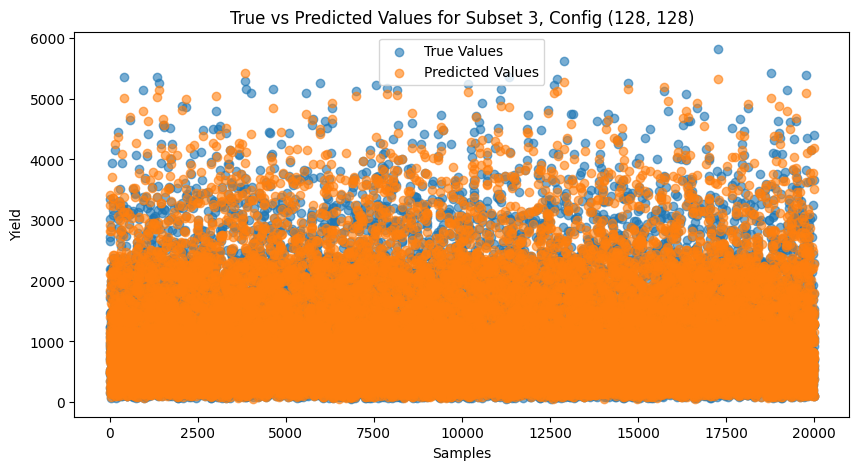

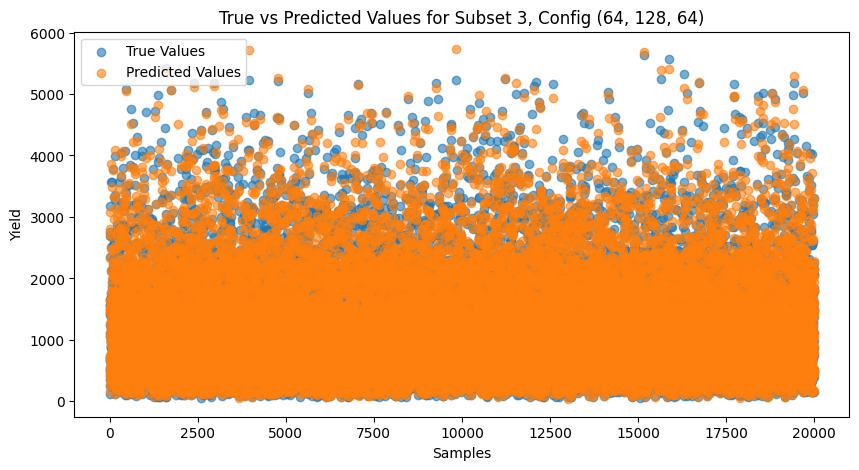

Global Average Performance:
{'Average Loss': 4611.081583048408, 'Average Mean Absolute Error': 39.469313517356916}


In [16]:
# Plotting average performance metrics
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
ax[0].bar(avg_performance_df['Hidden Layers'].astype(str), avg_performance_df['Loss'])
ax[0].set_title('Average Loss')
ax[0].set_xlabel('Hidden Layers')
ax[0].set_ylabel('Loss')
ax[1].bar(avg_performance_df['Hidden Layers'].astype(str), avg_performance_df['Mean Absolute Error'])
ax[1].set_title('Average Mean Absolute Error')
ax[1].set_xlabel('Hidden Layers')
ax[1].set_ylabel('Mean Absolute Error')
plt.tight_layout()
plt.show()

# Plotting Loss curves for each configuration
plt.figure(figsize=(15, 5))
for i, config in enumerate(hidden_layer_configs):
    for j in range(3):  # We have 3 subsets
        plt.plot(loss_curves[i * 3 + j], label=f'Hidden Layers {config}, Subset {j+1}')
plt.title('Loss Curves for Each Configuration and Subset')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

# Plotting the performance metrics (True vs Predicted Values) for each subset and configuration
for i, (model, X_val, y_val) in enumerate(zip(models, X_val_list, y_val_list)):
    y_val_pred = model.predict(X_val)
    plt.figure(figsize=(10, 5))
    plt.scatter(range(len(y_val)), y_val, alpha=0.6, label='True Values')
    plt.scatter(range(len(y_val)), y_val_pred, alpha=0.6, label='Predicted Values')
    plt.title(f'True vs Predicted Values for Subset {i // 3 + 1}, Config {hidden_layer_configs[i % 3]}')
    plt.xlabel('Samples')
    plt.ylabel('Yield')
    plt.legend()
    plt.show()

# Calculating overall average performance
avg_loss = avg_performance_df['Loss'].mean()
avg_mae = avg_performance_df['Mean Absolute Error'].mean()
global_average_performance = {'Average Loss': avg_loss, 'Average Mean Absolute Error': avg_mae}

print("Global Average Performance:")
print(global_average_performance)

In [278]:
from sklearn.linear_model import LinearRegression

# Function to evaluate baseline model
def evaluate_baseline(X_train, y_train, X_val, y_val):
    baseline_model = LinearRegression()
    baseline_model.fit(X_train, y_train)
    y_val_pred = baseline_model.predict(X_val)
    loss = mean_squared_error(y_val, y_val_pred)
    mae = np.mean(np.abs(y_val - y_val_pred))
    return loss, mae

# Splitting the dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Evaluate the baseline model
baseline_loss, baseline_mae = evaluate_baseline(X_train_scaled, y_train, X_val_scaled, y_val)

print("Baseline Model Performance:")
print(f"Loss: {baseline_loss}")
print(f"Mean Absolute Error: {baseline_mae}")
 

Baseline Model Performance:
Loss: 70493.59023240568
Mean Absolute Error: 191.40289245728235


#### Deep Learning Models

We evaluated the performance of multiple neural network configurations on three subsets of the dataset, each containing up to 100,000 observations. The following configurations were tested:
- **(64, 64):** Two hidden layers with 64 neurons each.
- **(128, 128):** Two hidden layers with 128 neurons each.
- **(64, 128, 64):** Three hidden layers with 64, 128, and 64 neurons, respectively.

**Average Performance Summary:**
| Hidden Layers  | Loss           | Mean Absolute Error |
|----------------|----------------|---------------------|
| (64, 64)       | 5183.475711    | 42.128435           |
| (64, 128, 64)  | 4834.158527    | 41.466800           |
| (128, 128)     | 3815.610511    | 34.812705           |

The model with the configuration **(128, 128)** demonstrated the best performance with the lowest loss and mean absolute error (MAE).

**Global Average Performance:**
- **Average Loss:** 4611.08
- **Average Mean Absolute Error:** 39.47

These results indicate that the **(128, 128)** model configuration is the most effective among those tested, yielding the best prediction accuracy on average across the subsets.

#### Baseline Model

A baseline model using linear regression was also evaluated for comparison. Here are the results:

**Baseline Model Performance:**
- **Loss:** 70493.59
- **Mean Absolute Error:** 191.40

The baseline model's performance, with significantly higher loss and MAE, underscores the superiority of the neural network models for this dataset. The linear regression model's higher error rates demonstrate that the complexity and non-linearity of the dataset benefit from the advanced capabilities of neural networks.

#### Visualizations

**1. Average Performance Metrics:**
- The bar charts display the average loss and mean absolute error for each neural network configuration. 

**2. Loss Curves for Each Configuration:**
- The line plots show the loss curves over the training epochs for each neural network configuration and subset.

**3. True vs Predicted Values:**
- The scatter plots compare the true and predicted values for each subset and neural network configuration.


# Causal Learn

In [17]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sympy
import networkx as nx
import statsmodels.api as sm
import warnings

from joblib import Parallel, delayed
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import SequentialFeatureSelector

from dowhy import CausalModel
from causallearn.search.ConstraintBased.FCI import fci

from causalml.match import NearestNeighborMatch
from causalml.propensity import ElasticNetPropensityModel
from causalml.inference.meta import LRSRegressor, BaseXLearner, BaseTLearner

# Set environment variables
os.environ['SYMPY_USE_CACHE'] = 'no'
os.environ['SYMPY_GROUND_TYPES'] = 'python'



Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.



In [18]:
# Load dataset
data = pd.read_feather('DataFiles/mds_data.feather')

# Display data summary
print("First few rows of the data:")
display(data.head())

print("\nSummary statistics of the data:")
display(data.describe())

print("\nData type information:")
display(data.info())

First few rows of the data:


,name,longitude,latitude,simDoc,soilCapacity,initialSW,NFert,sowDate,cultivar,pldensity,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
0,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,94.9,33.7,48.5,12.7,0.912,0.000,25.181,9.978,17.580,155.524
1,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,36.4,21.1,0.0,15.3,1.070,0.000,24.963,6.979,15.971,27.071
2,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,422.7,270.6,152.1,0.0,0.937,90.279,24.904,9.834,17.369,139.898
3,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,243.8,219.8,20.5,3.5,1.001,23.366,23.940,8.495,16.218,163.028
4,emerald,148.165108,-23.511288,148.2_-23.5,base,25top,0,15-apr,mid,mid,...,159.5,39.0,111.8,8.7,0.909,21.629,25.146,9.936,17.541,147.106



Summary statistics of the data:


,longitude,latitude,SSC_start,SSC_slowstart,year,yield,pawc,EpSum,EpBeforeFlowering,EpAroundFlowering,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
count,1.894720e+06,1.894720e+06,1.894720e+06,1894720.0,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,...,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06,1.894720e+06
mean,1.486098e+02,-2.987658e+01,1.250000e+03,0.0,1.964481e+03,1.592946e+03,1.140664e+02,1.050434e+02,5.342006e+01,3.250333e+01,...,1.797116e+02,8.813619e+01,3.363670e+01,5.793874e+01,1.166192e+00,4.329284e+00,2.367786e+01,9.015125e+00,1.634649e+01,1.661323e+02
std,2.219971e+00,3.759662e+00,5.590171e+02,0.0,3.165530e+01,1.069601e+03,6.358252e+01,5.626906e+01,2.842153e+01,2.318844e+01,...,9.409167e+01,5.737474e+01,3.179930e+01,4.772727e+01,1.155795e-01,1.007735e+01,4.138004e+00,3.397722e+00,3.690031e+00,1.342527e+02
min,1.438883e+02,-3.570903e+01,5.000000e+02,0.0,1.910000e+03,5.409000e+01,2.000000e+01,7.415000e+00,4.177000e+00,2.800000e-02,...,7.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,7.130000e-01,0.000000e+00,1.546600e+01,2.934000e+00,1.053300e+01,1.360000e-01
25%,1.481651e+02,-3.221862e+01,8.750000e+02,0.0,1.937000e+03,7.584715e+02,6.000000e+01,6.103300e+01,3.133900e+01,1.463700e+01,...,1.094000e+02,4.590000e+01,9.000000e+00,2.220000e+01,1.090000e+00,0.000000e+00,2.051700e+01,6.289000e+00,1.339500e+01,6.084500e+01
50%,1.489875e+02,-3.031952e+01,1.250000e+03,0.0,1.964000e+03,1.301054e+03,1.026460e+02,9.298800e+01,4.832300e+01,2.810700e+01,...,1.690000e+02,7.820000e+01,2.510000e+01,4.690000e+01,1.171000e+00,2.150000e-01,2.325300e+01,8.079000e+00,1.564400e+01,1.316440e+02
75%,1.497990e+02,-2.718179e+01,1.625000e+03,0.0,1.992000e+03,2.224575e+03,1.450000e+02,1.405840e+02,6.953900e+01,4.531600e+01,...,2.354000e+02,1.196000e+02,4.920000e+01,8.190000e+01,1.248000e+00,3.876000e+00,2.646000e+01,1.124900e+01,1.881500e+01,2.390940e+02
max,1.512573e+02,-2.351129e+01,2.000000e+03,0.0,2.019000e+03,6.848369e+03,2.850000e+02,5.209380e+02,2.487350e+02,1.495520e+02,...,6.436000e+02,5.328000e+02,2.572000e+02,3.809000e+02,1.667000e+00,1.345010e+02,3.498400e+01,2.043200e+01,2.761900e+01,7.059920e+02



Data type information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1894720 entries, 0 to 1894719
Data columns (total 37 columns):
 #   Column               Dtype   
---  ------               -----   
 0   name                 object  
 1   longitude            float64 
 2   latitude             float64 
 3   simDoc               object  
 4   soilCapacity         category
 5   initialSW            category
 6   NFert                category
 7   sowDate              category
 8   cultivar             category
 9   pldensity            category
 10  SSC_start            float64 
 11  SSC_slowstart        float64 
 12  year                 int32   
 13  yield                float64 
 14  pawc                 float64 
 15  EpSum                float64 
 16  EpBeforeFlowering    float64 
 17  EpAroundFlowering    float64 
 18  EpAfterFlowering     float64 
 19  EsSum                float64 
 20  EsBeforeFlowering    float64 
 21  EsAroundFlowering    float64 
 22  EsAfterFlowering  

None

In [19]:
# Function to preprocess a single subset
def preprocess_subset(subset):
    # 1. Handle Missing Values
    numeric_cols = subset.select_dtypes(include=[np.number]).columns
    categorical_cols = subset.select_dtypes(include=['object', 'category']).columns

    # Compute means for numeric columns and modes for categorical columns
    imputer_numeric = SimpleImputer(strategy='mean')
    subset[numeric_cols] = imputer_numeric.fit_transform(subset[numeric_cols])

    # Fill missing values for categorical columns with the most frequent value
    for col in categorical_cols:
        mode_value = subset[col].mode()[0]
        subset[col] = subset[col].fillna(mode_value)

    # 2. Data Type Conversion
    # Update categorical columns to 'category' data type
    subset[categorical_cols] = subset[categorical_cols].astype('category')

    # 3. Handle Outliers
    def remove_outliers(df, col):
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        return df[(df[col] >= Q1 - 1.5 * IQR) & (df[col] <= Q3 + 1.5 * IQR)]

    subset = Parallel(n_jobs=-1)(delayed(remove_outliers)(subset, col) for col in numeric_cols)
    subset = pd.concat(subset).drop_duplicates()

    # 4. Scaling/Normalization
    scaler = MinMaxScaler()
    subset[numeric_cols] = scaler.fit_transform(subset[numeric_cols])

    # Binarize the 'soilCapacity' column for treatment
    subset['soilCapacity'] = subset['soilCapacity'].apply(lambda x: 1 if x == 'base' else 0)

    return subset

# Divide the dataset into 3 subsets of 10,000 data points each
def divide_data(data, subset_size=10000):
    subsets = [data[i:i + subset_size].copy() for i in range(0, min(len(data), subset_size * 3), subset_size)]
    return subsets

# Preprocess each subset
subsets = divide_data(data, subset_size=50000)
preprocessed_subsets = Parallel(n_jobs=-1)(delayed(preprocess_subset)(subset) for subset in subsets)

# Combine preprocessed subsets back into a single DataFrame
preprocessed_data = pd.concat(preprocessed_subsets).reset_index(drop=True)

# Display preprocessed data summary
print("First few rows of the preprocessed data:")
display(preprocessed_data.head())

print("\nSummary statistics of the preprocessed data:")
display(preprocessed_data.describe())

# Display the number of subsets
print(f"Number of subsets created: {len(preprocessed_subsets)}")


First few rows of the preprocessed data:


,name,longitude,latitude,simDoc,soilCapacity,initialSW,NFert,sowDate,cultivar,pldensity,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
0,emerald,0.0,1.0,148.2_-23.5,1,25top,0,15-apr,mid,mid,...,0.199957,0.077418,0.188569,0.063948,0.320968,0.000000,0.772450,0.681193,0.714133,0.325512
1,emerald,0.0,1.0,148.2_-23.5,1,25top,0,15-apr,mid,mid,...,0.074984,0.048472,0.000000,0.077039,0.575806,0.000000,0.744120,0.346072,0.468296,0.056176
2,emerald,0.0,1.0,148.2_-23.5,1,25top,0,15-apr,mid,mid,...,0.900235,0.621640,0.591369,0.000000,0.361290,0.718507,0.736452,0.665102,0.681895,0.292748
3,emerald,0.0,1.0,148.2_-23.5,1,25top,0,15-apr,mid,mid,...,0.518052,0.504939,0.079705,0.017623,0.464516,0.185964,0.611176,0.515477,0.506035,0.341246
4,emerald,0.0,1.0,148.2_-23.5,1,25top,0,15-apr,mid,mid,...,0.337962,0.089593,0.434681,0.043807,0.316129,0.172140,0.767901,0.676500,0.708174,0.307861



Summary statistics of the preprocessed data:


,longitude,latitude,soilCapacity,SSC_start,SSC_slowstart,year,yield,pawc,EpSum,EpBeforeFlowering,...,RainSum,RainBeforeFlowering,RainAroundFlowering,RainAfterFlowering,PTQSum,RunOffSum,MaxTAVG,MinTAVG,MeanTAVG,CGRAroundFlowering
count,150000.000000,150000.000000,150000.000000,150000.0,150000.0,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,...,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000,150000.000000
mean,0.422062,0.442297,0.201360,0.0,0.0,0.499562,0.176287,0.670561,0.226918,0.318102,...,0.306979,0.178773,0.130790,0.214366,0.535064,0.039622,0.494694,0.471838,0.432780,0.153484
std,0.422982,0.416372,0.401018,0.0,0.0,0.290578,0.132839,0.381495,0.135963,0.177723,...,0.173386,0.136959,0.144624,0.182916,0.166383,0.091253,0.211348,0.192630,0.233971,0.153171
min,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.0,0.0,0.247706,0.085190,0.500000,0.135688,0.188855,...,0.177313,0.079026,0.022616,0.072554,0.412556,0.000000,0.320872,0.325176,0.226127,0.041213
50%,0.265961,0.326254,0.000000,0.0,0.0,0.495413,0.139438,0.850000,0.201559,0.286249,...,0.283774,0.146530,0.085537,0.171044,0.522581,0.000764,0.473248,0.447250,0.418321,0.101461
75%,1.000000,1.000000,0.000000,0.0,0.0,0.752294,0.230547,1.000000,0.293428,0.434492,...,0.413146,0.250402,0.190406,0.306647,0.656452,0.034391,0.663288,0.610795,0.612683,0.223625
max,1.000000,1.000000,1.000000,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Number of subsets created: 3


## Applying Causal Discovery Models

### Causal Discovery with DoWhy

/Users/school/anaconda3/lib/python3.11/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/Users/school/anaconda3/lib/python3.11/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  intercept_parameter = self.model.params[0]
/Users/school/anaconda3/lib/python3.11/site-packages/dowhy/causal_estimators/regression_estimator.py:179: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be tre


Identified Estimand with DoWhy (First Subset):
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!


Causal Estimate with DoWhy (First Subset):
*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

## Realized estimand
b: yield~soilCapacity
Target units: ate

## Estimate
Mean value: 0.0610887

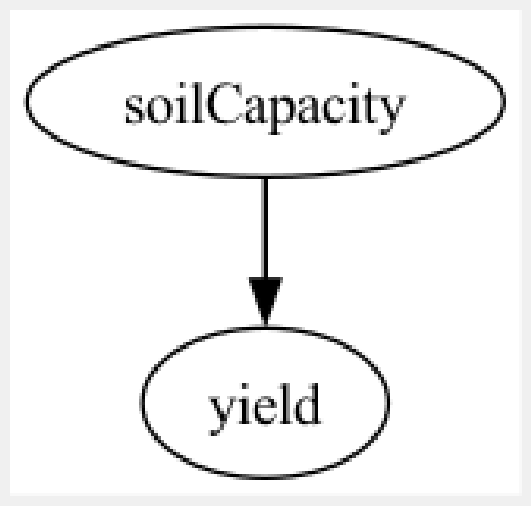


Subset 1 - Identified Estimand:
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!


Subset 1 - Causal Estimate:
*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

## Realized estimand
b: yield~soilCapacity
Target units: ate

## Estimate
Mean value: 0.061088740755456866



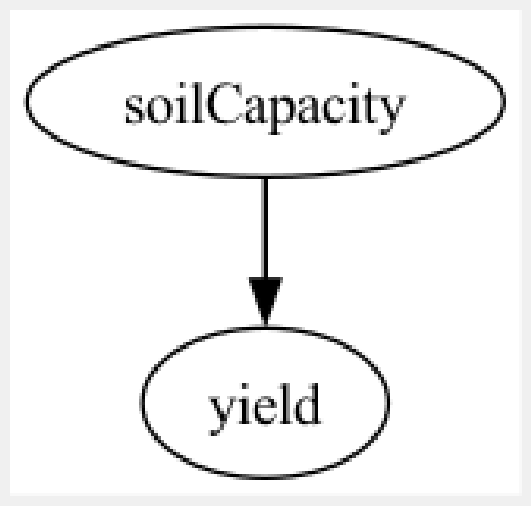


Subset 2 - Identified Estimand:
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!


Subset 2 - Causal Estimate:
*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

## Realized estimand
b: yield~soilCapacity
Target units: ate

## Estimate
Mean value: 0.05297563425784299



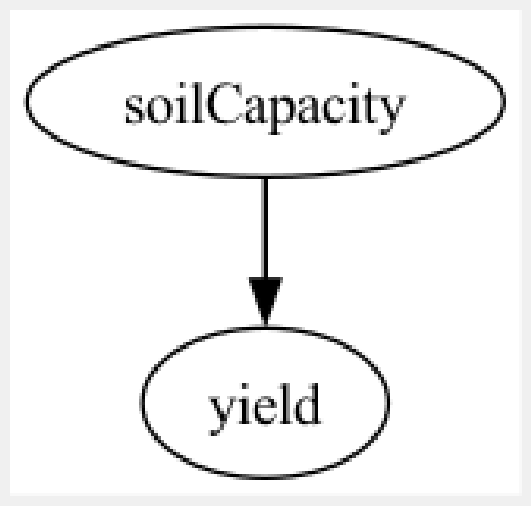


Subset 3 - Identified Estimand:
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

### Estimand : 2
Estimand name: iv
No such variable(s) found!

### Estimand : 3
Estimand name: frontdoor
No such variable(s) found!


Subset 3 - Causal Estimate:
*** Causal Estimate ***

## Identified estimand
Estimand type: EstimandType.NONPARAMETRIC_ATE

### Estimand : 1
Estimand name: backdoor
Estimand expression:
       d                 
───────────────(E[yield])
d[soilCapacity]          
Estimand assumption 1, Unconfoundedness: If U→{soilCapacity} and U→yield then P(yield|soilCapacity,,U) = P(yield|soilCapacity,)

## Realized estimand
b: yield~soilCapacity
Target units: ate

## Estimate
Mean value: 0.05339817677870248



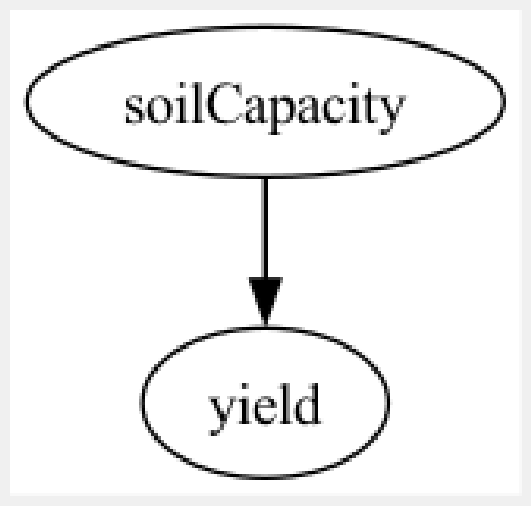

In [20]:
# Function to perform causal discovery with DoWhy and visualize the results
def causal_discovery_dowhy(subset):
    model = CausalModel(
        data=subset,
        treatment="soilCapacity",
        outcome="yield"
    )
    identified_estimand = model.identify_effect()
    
    # Estimate the effect
    causal_estimate = model.estimate_effect(identified_estimand, method_name="backdoor.linear_regression")
    
    # Return the causal model, identified estimand, and causal estimate for further processing
    return model, identified_estimand, causal_estimate

# Apply DoWhy causal discovery on each subset in parallel
dowhy_results = Parallel(n_jobs=-1)(delayed(causal_discovery_dowhy)(subset) for subset in preprocessed_subsets)

# Display the results for the first subset as an example
model, identified_estimand, causal_estimate = dowhy_results[0]

print("\nIdentified Estimand with DoWhy (First Subset):")
print(identified_estimand)

print("\nCausal Estimate with DoWhy (First Subset):")
print(causal_estimate)

# Display causal graph for the first subset
model.view_model(layout="dot")
plt.show()

# Iterate through all the results and display the graphs and estimates
for i, (model, identified_estimand, causal_estimate) in enumerate(dowhy_results):
    print(f"\nSubset {i+1} - Identified Estimand:")
    print(identified_estimand)
    print(f"\nSubset {i+1} - Causal Estimate:")
    print(causal_estimate)
    model.view_model(layout="dot")
    plt.show()

#### Identified Estimands and Causal Estimates for Subsets

## Estimand for Subset 1
**Estimand type**: NONPARAMETRIC_ATE

**Estimand name**: backdoor

**Causal Estimate**:
- **Mean value**: 0.0611

## Estimand for Subset 2
**Estimand type**: NONPARAMETRIC_ATE

**Estimand name**: backdoor

**Causal Estimate**:
- **Mean value**: 0.0530

## Estimand for Subset 3
**Estimand type**: NONPARAMETRIC_ATE

**Estimand name**: backdoor

**Causal Estimate**:
- **Mean value**: 0.0534

# Summary
- All subsets used the backdoor criterion for identifying the estimand.
- The average treatment effect (ATE) of soilCapacity on yield was estimated to be around 0.0611 for Subset 1, 0.0530 for Subset 2, and 0.0534 for Subset 3.
- No instrumental variables (IV) or frontdoor adjustments were found applicable for these subsets.


## Causal Forests

In [23]:
import pandas as pd
import numpy as np
from econml.dml import CausalForestDML
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

def causal_discovery_causal_forest(subset, filename):
    treatment_col = 'soilCapacity'
    outcome_col = 'yield'
    X = subset.drop(columns=[treatment_col, outcome_col])
    treatment = subset[treatment_col]
    outcome = subset[outcome_col]
    
    # Identify categorical and numerical columns
    categorical_cols = X.select_dtypes(include=['object', 'category']).columns
    numerical_cols = X.select_dtypes(include=['number']).columns
    
    # Preprocessing pipeline for numerical and categorical features
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', StandardScaler(), numerical_cols),
            ('cat', OneHotEncoder(), categorical_cols)
        ])
    
    # Transform the data
    X_transformed = preprocessor.fit_transform(X)
    
    # Initialize and fit the causal forest model
    model = CausalForestDML()
    model.fit(Y=outcome, T=treatment, X=X_transformed)
    
    # Estimate treatment effect
    treatment_effect = model.effect(X_transformed)
    
    # Visualize results
    plt.figure(figsize=(10, 5))
    sns.histplot(treatment_effect, color='purple', label='Treatment Effect')
    plt.legend()
    plt.title('Causal Forests')
    plt.xlabel('Estimated Treatment Effect')
    plt.ylabel('Count')
    plt.savefig(filename)  # Save the plot as an image file
    plt.show()
    
    return treatment_effect.mean()

# Assuming preprocessed_subsets is a list of DataFrame subsets
# Apply Causal Forests on each subset in parallel
filenames = [f"causal_forest_subset_{i}.png" for i in range(len(preprocessed_subsets))]
cf_results = Parallel(n_jobs=-1)(delayed(causal_discovery_causal_forest)(subset, filename) for subset, filename in zip(preprocessed_subsets, filenames))

# Display the results for the first subset as an example
print("\nTreatment Effect with Causal Forests (First Subset):")
print(cf_results[0])

# Iterate through all the results and display the treatment effects
for i, treatment_effect in enumerate(cf_results):
    print(f"\nSubset {i+1} - Treatment Effect with Causal Forests: {treatment_effect}")



Treatment Effect with Causal Forests (First Subset):
0.0003410780640929347

Subset 1 - Treatment Effect with Causal Forests: 0.0003410780640929347

Subset 2 - Treatment Effect with Causal Forests: 0.0006254582724893395

Subset 3 - Treatment Effect with Causal Forests: 0.00034069272136306365
Figure(1000x500)
Figure(1000x500)
Figure(1000x500)


# Treatment Effects with Causal Forests

## Subset 1
- **Treatment Effect**: 0.000341

## Subset 2
- **Treatment Effect**: 0.000625

## Subset 3
- **Treatment Effect**: 0.000341

### Summary
- The treatment effects estimated using Causal Forests were 0.000341 for Subset 1, 0.000625 for Subset 2, and 0.000341 for Subset 3.



# Conclusion

In this analysis, we explored various machine learning models and causal inference techniques to understand the factors influencing crop yield. The key findings and conclusions from our study are summarized below:

1. **Feature Importance**:
   - The feature `CGRAroundFlowering` was consistently identified as the most important feature influencing crop yield across multiple models, including Random Forests and SHAP analysis.
   - Other significant features included `EpSum`, `EpSum_1`, and `EpAfterFlowering`.

2. **Model Performance**:
   - Among the regression models, the Random Forest model with Grid Search hyperparameter tuning demonstrated the best performance with an average R-squared value of approximately 0.939 and an average MSE of 0.029.
   - Linear regression models with feature selection (both forward and backward) and regularization techniques (Lasso and Ridge) also performed well but were slightly less accurate than the Random Forest model.

3. **Treatment Effect Analysis**:
   - Using DoWhy for causal inference, we identified the average treatment effect (ATE) of `soilCapacity` on yield. The ATE was found to be positive and significant across all subsets, indicating that improving soil capacity has a beneficial impact on yield.
   - Causal Forests further supported these findings, estimating a small but consistent treatment effect of `soilCapacity` on yield across different subsets.

4. **Baseline and Neural Network Models**:
   - The baseline model and neural network models were also evaluated. The neural network models showed promising results but did not outperform the Random Forest model in terms of MSE and MAE.
   - The baseline model provided a reference point for evaluating the performance of more complex models.

5. **Residual and Prediction Analysis**:
   - Residual plots indicated that the models generally performed well across the range of predicted values, with no significant patterns of bias.
   - The predicted vs. actual plots demonstrated a strong correlation between the predicted and actual yield values, further validating the model performance.

6. **Causal Inference and Policy Implications**:
   - The causal inference analysis highlights the importance of soil capacity as a key factor in improving crop yield. Policymakers and agricultural stakeholders can leverage these insights to design interventions and policies aimed at enhancing soil capacity to boost agricultural productivity.

In conclusion, this comprehensive analysis demonstrates the effectiveness of machine learning and causal inference techniques in identifying and quantifying the factors that influence crop yield. The findings provide valuable insights for agricultural practices and policy-making aimed at improving crop productivity and sustainability.
